# Imports

In [1]:
import pandas as pd
import numpy as np
from collections import Counter
import time

import matplotlib.pyplot as plt
import seaborn as sns
import squarify # for treemap
from wordcloud import WordCloud

import nltk
from nltk.tokenize import word_tokenize, RegexpTokenizer
from nltk import ngrams

# from textblob import TextBlob

from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn import manifold
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
from sklearn.model_selection import train_test_split

In [2]:
COLOR = '#62d197'

# EDA

## Import data

In [3]:
data = pd.read_csv('../data/Flipkart/flipkart_com-ecommerce_sample_1050.csv')
df = pd.DataFrame(data)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1050 entries, 0 to 1049
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   uniq_id                  1050 non-null   object 
 1   crawl_timestamp          1050 non-null   object 
 2   product_url              1050 non-null   object 
 3   product_name             1050 non-null   object 
 4   product_category_tree    1050 non-null   object 
 5   pid                      1050 non-null   object 
 6   retail_price             1049 non-null   float64
 7   discounted_price         1049 non-null   float64
 8   image                    1050 non-null   object 
 9   is_FK_Advantage_product  1050 non-null   bool   
 10  description              1050 non-null   object 
 11  product_rating           1050 non-null   object 
 12  overall_rating           1050 non-null   object 
 13  brand                    712 non-null    object 
 14  product_specifications  

In [4]:
print(f'This dataset has {df.shape[0]} rows and {df.shape[1]} columns')

This dataset has 1050 rows and 15 columns


## Duplicates

In [5]:
# Check for duplicates on uniq_id
duplicates = df.duplicated(subset='uniq_id')
print(f'This dataset has {duplicates.sum()} duplicates')

This dataset has 0 duplicates


## Missing values

In [6]:
# Get missing values
missing = df.isnull().sum()
print(f'This dataset has {missing.sum()} missing')
brands_missing = df['brand'].isnull().sum()
print(f'{brands_missing} missing values in the brand column')
retail_missing = df['retail_price'].isnull().sum()
print(f'{retail_missing} missing value in the retail_price column')
discount_missing = df['discounted_price'].isnull().sum()
print(f'{discount_missing} missing value in the discounted_price column')

This dataset has 341 missing
338 missing values in the brand column
1 missing value in the retail_price column
1 missing value in the discounted_price column


As we won't use these columns in the project, there is no need to work on these values.

## Features selection

The objective is to suggest a classification in the appropriate category(ies) based on a product description and/or a product image. We will select the features according to this objective.

In [4]:
# Filter information
to_keep = ['uniq_id', 'product_name', 'product_category_tree', 'description', 'image']
print('As our goal is to create a classifier, we will keep only the following columns:')
for col in to_keep:
    print(f' - {col}')

As our goal is to create a classifier, we will keep only the following columns:
 - uniq_id
 - product_name
 - product_category_tree
 - description
 - image


In [5]:
df = df[to_keep]

## Category tree structure

In [6]:
# Get informations about category tree
df['product_category_tree'].apply(lambda x: x.split('>>')[0].replace('["','').replace(']','').strip()).value_counts()


product_category_tree
Home Furnishing               150
Baby Care                     150
Watches                       150
Home Decor & Festive Needs    150
Kitchen & Dining              150
Beauty and Personal Care      150
Computers                     150
Name: count, dtype: int64

In [7]:
# Add a column main_category
df['main_category'] = df['product_category_tree'].apply(lambda x: x.split('>>')[0].replace('["','').replace(']','').strip())
df.head(2)

,uniq_id,product_name,product_category_tree,description,image,main_category
0,55b85ea15a1536d46b7190ad6fff8ce7,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",Key Features of Elegance Polyester Multicolor ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Home Furnishing
1,7b72c92c2f6c40268628ec5f14c6d590,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",Specifications of Sathiyas Cotton Bath Towel (...,7b72c92c2f6c40268628ec5f14c6d590.jpg,Baby Care


### Tree deepness

In [8]:
def split_subcategories(product):
    cleaned = product.strip('["]').replace(' >> ', '>>')
    categories = cleaned.split('>>')

    return categories[:-1] # Remove the last element which is the product itself

def extract_subcategories(row):
    categories = row.strip('["]').split(' >> ')
    sub_categories = ' '.join(categories[1:])  # Joindre toutes les sous-catégories en une seule chaîne
    return sub_categories

In [9]:
df_cat = df.copy()
# Get all subcategories
df_cat['subcategories'] = df_cat['product_category_tree'].apply(split_subcategories)
deep_max = df_cat['subcategories'].apply(len).max()
print(f'The maximum number of subcategories is {deep_max}')

# Create a column for each subcategory
for i in range(1, deep_max+1):
    df_cat[f'subcategory_{i}'] = df_cat['subcategories'].apply(lambda x: x[i] if i < len(x) else None)

# df_cat.drop(columns=['subcategories'], inplace=True)
df_cat.tail(3)

The maximum number of subcategories is 6


,uniq_id,product_name,product_category_tree,description,image,main_category,subcategories,subcategory_1,subcategory_2,subcategory_3,subcategory_4,subcategory_5,subcategory_6
1047,5912e037d12774bb73a2048f35a00009,Uberlyfe Extra Large Pigmented Polyvinyl Films...,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",Buy Uberlyfe Extra Large Pigmented Polyvinyl F...,5912e037d12774bb73a2048f35a00009.jpg,Baby Care,"[Baby Care, Baby & Kids Gifts, Stickers]",Baby & Kids Gifts,Stickers,None,None,None,None
1048,c3edc504d1b4f0ba6224fa53a43a7ad6,Wallmantra Medium Vinyl Sticker Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",Buy Wallmantra Medium Vinyl Sticker Sticker fo...,c3edc504d1b4f0ba6224fa53a43a7ad6.jpg,Baby Care,"[Baby Care, Baby & Kids Gifts, Stickers]",Baby & Kids Gifts,Stickers,None,None,None,None
1049,f2f027ad6a6df617c9f125173da71e44,Uberlyfe Large Vinyl Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",Buy Uberlyfe Large Vinyl Sticker for Rs.595 on...,f2f027ad6a6df617c9f125173da71e44.jpg,Baby Care,"[Baby Care, Baby & Kids Gifts, Stickers]",Baby & Kids Gifts,Stickers,None,None,None,None


In [10]:
df_cat.loc[df_cat['main_category'] == 'Home Furnishing']['subcategory_1'].value_counts()

subcategory_1
Bed Linen                     65
Bath Linen                    21
Curtains & Accessories        19
Kitchen & Dining Linen        14
Cushions, Pillows & Covers    13
Floor Coverings                6
Living                         4
Living Room Furnishing         3
JMD Home Furnishing            1
Kripa's Home Furnishing        1
Tidy Home Furnishing           1
Name: count, dtype: int64

In [ ]:
df_cat.drop(columns=['product_category_tree', 'subcategories'], inplace=True)

In [11]:
categories = df['main_category'].unique()
for cat in categories:
    subcat_count = df_cat[df_cat['main_category'] == cat]['subcategory_1'].nunique()
    print(f'{cat} has {subcat_count} sub categories of rank 1')

Home Furnishing has 11 sub categories of rank 1
Baby Care has 9 sub categories of rank 1
Watches has 2 sub categories of rank 1
Home Decor & Festive Needs has 9 sub categories of rank 1
Kitchen & Dining has 11 sub categories of rank 1
Beauty and Personal Care has 11 sub categories of rank 1
Computers has 8 sub categories of rank 1


In [12]:
# group by main category and get the number of product per unique subcategories
df_cat_grouped = df_cat.groupby(['main_category'])[['subcategory_1', 'subcategory_2','subcategory_3','subcategory_4','subcategory_5','subcategory_6']].count().reset_index()
df_cat_grouped.head(10)

,main_category,subcategory_1,subcategory_2,subcategory_3,subcategory_4,subcategory_5,subcategory_6
0,Baby Care,150,150,111,87,56,0
1,Beauty and Personal Care,150,129,116,17,1,0
2,Computers,150,148,40,1,0,0
3,Home Decor & Festive Needs,149,114,61,9,0,0
4,Home Furnishing,148,42,10,0,0,0
5,Kitchen & Dining,150,86,66,13,0,0
6,Watches,150,10,1,0,0,0


3 products are directly categorized under the main category : 1 in the category 'Home Decor & Festive Needs' and 2 in the category'Home Furnishing'

In [13]:
df_cat.drop(columns=['subcategory_6'], inplace=True)

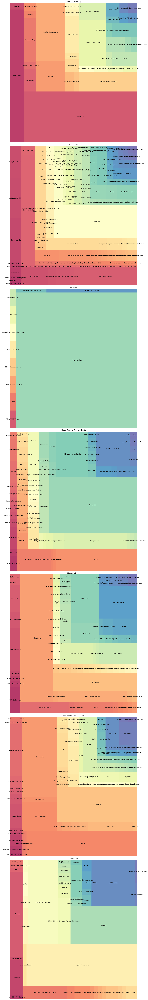

In [14]:
fig, axes = plt.subplots(len(categories), 1, figsize=(15, 100))

for i, cat in enumerate(categories):
    filtered_df = df_cat[df_cat['main_category'] == cat]

    # Count each subcategory occurence for the category
    subcategory_count = filtered_df.filter(like='subcategory_').apply(pd.Series.value_counts).sum(axis=1)

    # Create a dataframe for the subcategories and their count
    subcategories_df = pd.DataFrame({'subcategory': subcategory_count.index, 'count': subcategory_count.values})

    # plot the tree
    squarify.plot(
        sizes=subcategories_df['count'],
        label=subcategories_df['subcategory'],
        alpha=.8,
        color=sns.color_palette("Spectral", len(subcategories_df['count'])),
        ax=axes[i],
        text_kwargs = {'fontsize': 10, 'color': 'black'},
        )
    axes[i].set_title(cat)
    axes[i].axis('off')

plt.tight_layout()
plt.show()

This tree map shows that the categories lack of homogeneity. They each have more a less children subcategories

In [15]:
df['children'] = df['product_category_tree'].apply(extract_subcategories)
df.head()

,uniq_id,product_name,product_category_tree,description,image,main_category,children
0,55b85ea15a1536d46b7190ad6fff8ce7,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",Key Features of Elegance Polyester Multicolor ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Home Furnishing,Curtains & Accessories Curtains Elegance Polye...
1,7b72c92c2f6c40268628ec5f14c6d590,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",Specifications of Sathiyas Cotton Bath Towel (...,7b72c92c2f6c40268628ec5f14c6d590.jpg,Baby Care,Baby Bath & Skin Baby Bath Towels Sathiyas Bab...
2,64d5d4a258243731dc7bbb1eef49ad74,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",Key Features of Eurospa Cotton Terry Face Towe...,64d5d4a258243731dc7bbb1eef49ad74.jpg,Baby Care,Baby Bath & Skin Baby Bath Towels Eurospa Baby...
3,d4684dcdc759dd9cdf41504698d737d8,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",Key Features of SANTOSH ROYAL FASHION Cotton P...,d4684dcdc759dd9cdf41504698d737d8.jpg,Home Furnishing,Bed Linen Bedsheets SANTOSH ROYAL FASHION Beds...
4,6325b6870c54cd47be6ebfbffa620ec7,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",Key Features of Jaipur Print Cotton Floral Kin...,6325b6870c54cd47be6ebfbffa620ec7.jpg,Home Furnishing,Bed Linen Bedsheets Jaipur Print Bedsheets Jai...


In [16]:
# drop tree column
df = df.drop(columns='product_category_tree')

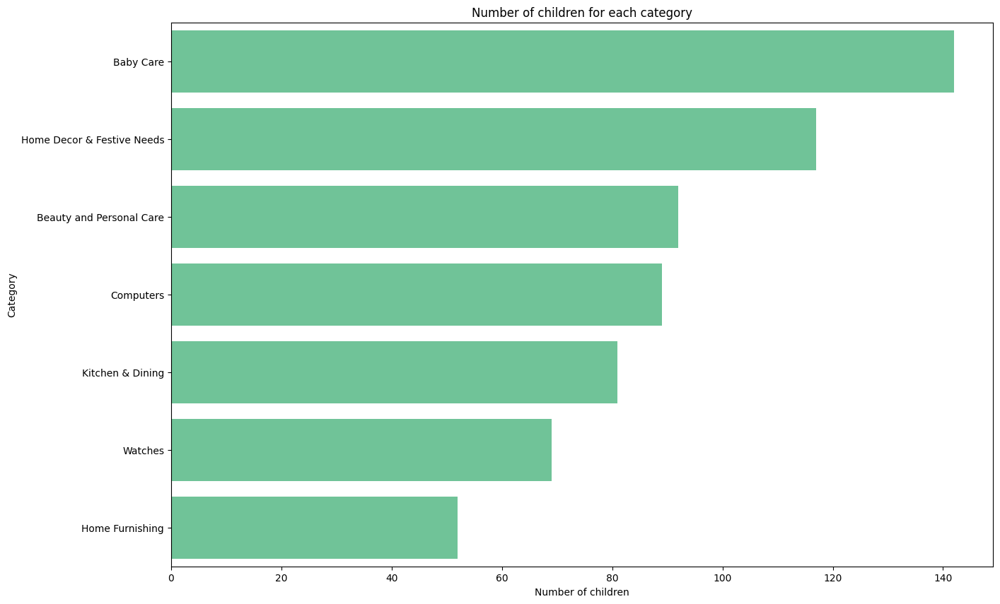

In [17]:
# Plot the number of children for each category
df_grouped = df.groupby('main_category')['children'].nunique().sort_values(ascending=False)
plt.figure(figsize=(15, 10))
sns.barplot(x=df_grouped.values, y=df_grouped.index, color=COLOR)
plt.title('Number of children for each category')
plt.xlabel('Number of children')
plt.ylabel('Category')
plt.show()


## Product description

In [18]:
# Normalize description to lowercase
df['description'] = df['description'].str.lower()

In [19]:
# Count number of characters in description
df['description_length'] = df['description'].apply(lambda x: len(x))
df['description_length'].describe()

count    1050.000000
mean      473.820952
std       457.910422
min       109.000000
25%       192.000000
50%       278.000000
75%       588.250000
max      3490.000000
Name: description_length, dtype: float64

In [20]:
# How many sentences in a description.
# A sentence starts with a capital letter and ends with a dot.
df['description_sentences'] = df['description'].apply(lambda x: len(x.split('.')))
df['description_sentences'].describe()

count    1050.000000
mean        6.604762
std         4.655836
min         1.000000
25%         5.000000
50%         6.000000
75%         8.000000
max        44.000000
Name: description_sentences, dtype: float64

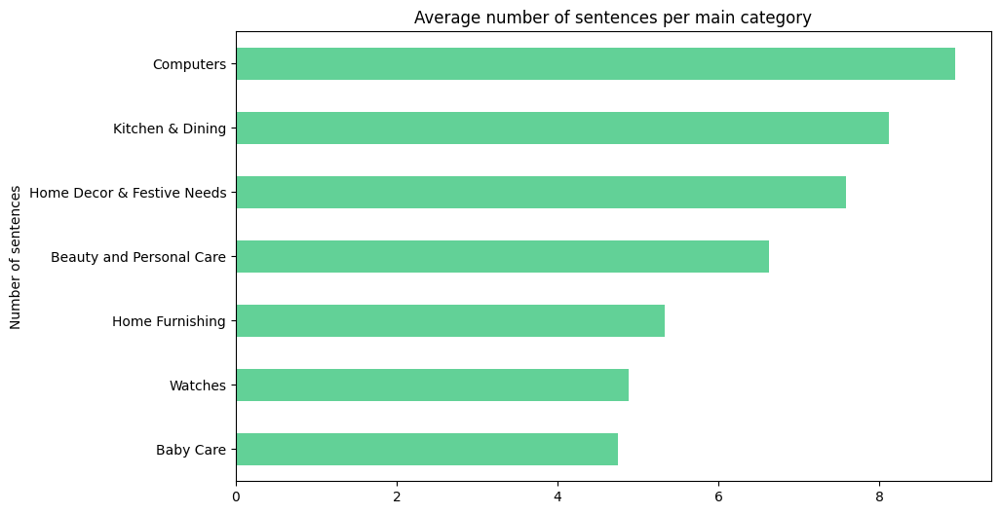

In [21]:
# plot the distribution of the number of sentences per main category ordered by the average number of sentences
# labels should be on the y-axis, and the number of sentences on the x-axis
fig = plt.figure(figsize=(10, 6))
df.groupby('main_category')['description_sentences'].mean().sort_values().plot(kind='barh', color=COLOR)
plt.title('Average number of sentences per main category')
plt.ylabel('Number of sentences')
plt.show()

In [22]:
home = df[df['main_category'] == 'Home Furnishing']

### WordCloud

In [23]:
# Count the number of tokens in the description
tokens_count = {}
tokens_frequency = {}
# Using regex to exclude numbers and punctuation
tokenizer = RegexpTokenizer(r'\b\w*[a-zA-Z]+\w*\b|\b[a-zA-Z]+\b')

for _, row in df.iterrows():
    category = row['main_category']
    description = row['description']

    tokens = tokenizer.tokenize(description)

    if category not in tokens_count:
        tokens_count[category] = 0
    tokens_count[category] += len(tokens)

    if category not in tokens_frequency:
        tokens_frequency[category] = {}

    for token in tokens:
        if token not in tokens_frequency[category]:
            tokens_frequency[category][token] = 0
        tokens_frequency[category][token] += 1

# Create a dataframe for the tokens frequency
frequencies = []
for category, tokens in tokens_frequency.items():
    for token, freq in tokens.items():
        frequencies.append({'category':category, 'token':token, 'frequency':freq})

tokens_df = pd.DataFrame(frequencies)
token_count_df = pd.DataFrame(list(tokens_count.items()), columns=['category', 'total_tokens'])

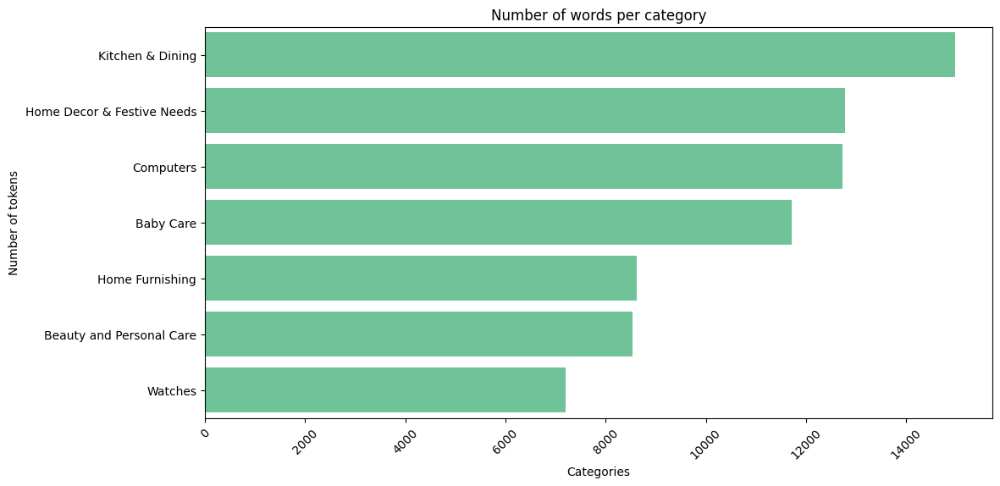

In [24]:
# Plot the number of tokens per category
plt.figure(figsize=(12, 6))
sns.barplot(x='total_tokens', y='category', data=token_count_df.sort_values(by='total_tokens', ascending=False), color=COLOR)
plt.xticks(rotation=45)
plt.title('Number of words per category')
plt.xlabel('Categories')
plt.ylabel('Number of tokens')
plt.show()

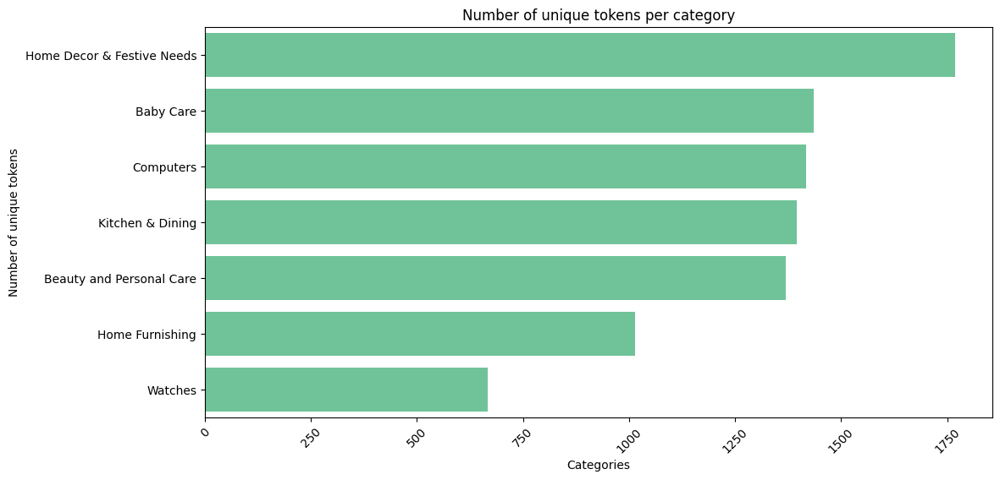

In [25]:
# Group by category to get the unique number of tokens
unique_tokens_count = tokens_df.groupby('category')['token'].count().reset_index()

# Plot the number of unique tokens per category
plt.figure(figsize=(12, 6))
sns.barplot(data=unique_tokens_count.sort_values(by='token', ascending=False), x='token', y='category', color=COLOR)
plt.xticks(rotation=45)
plt.title('Number of unique tokens per category')
plt.xlabel('Categories')
plt.ylabel('Number of unique tokens')
plt.show()

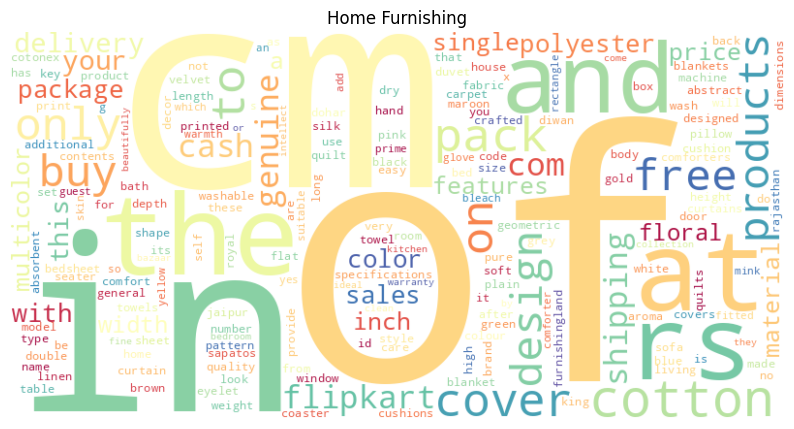

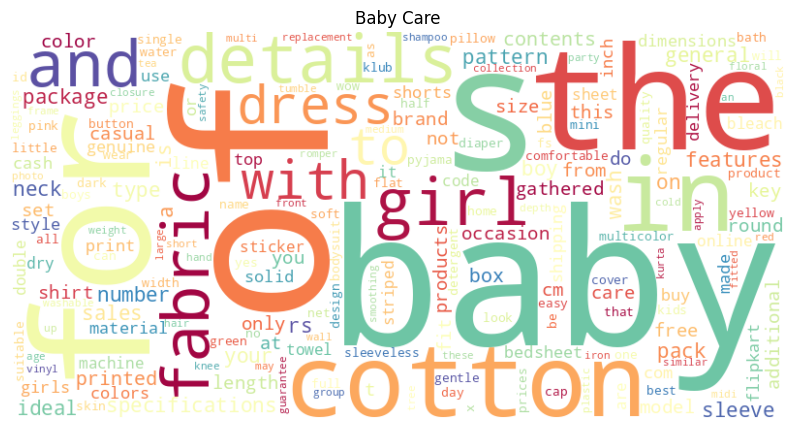

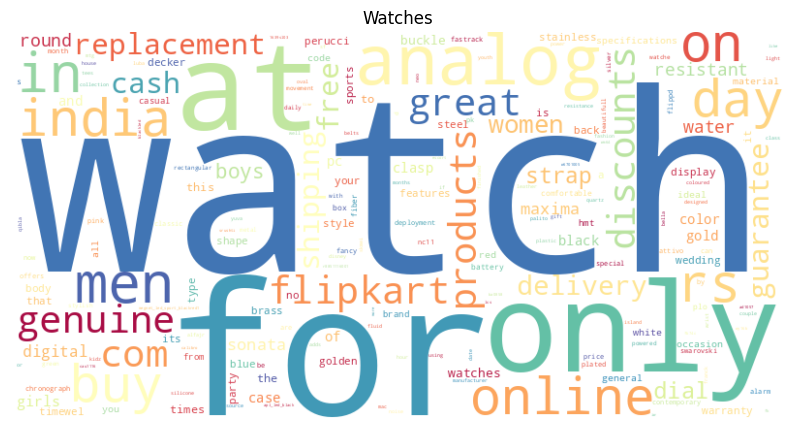

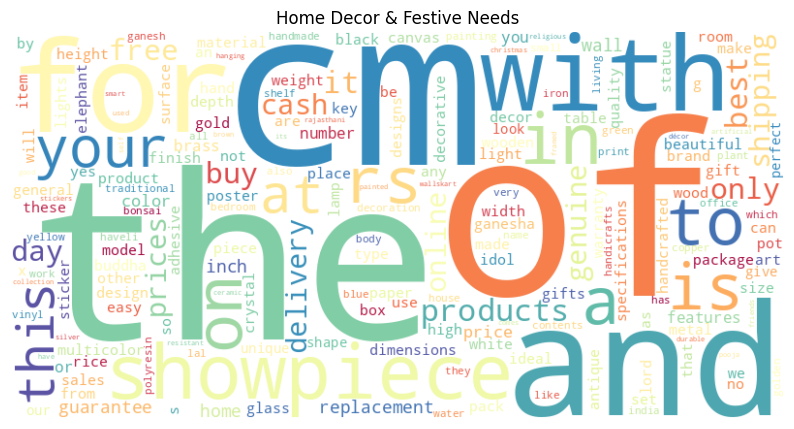

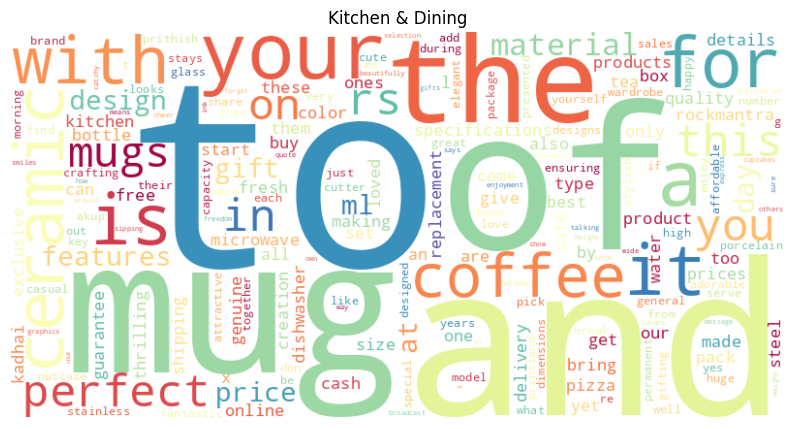

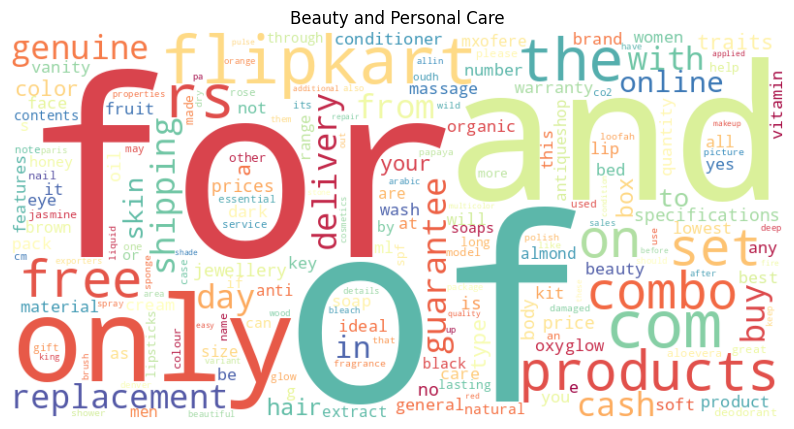

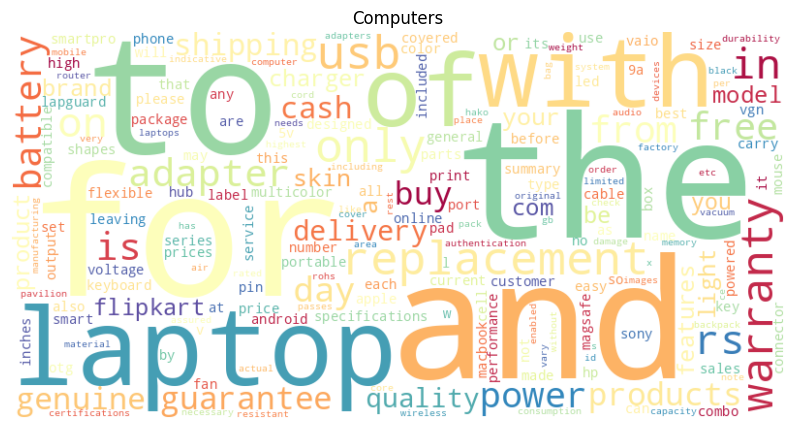

In [26]:
# Plot the WordCloud for each category
for category in tokens_df['category'].unique():
    # Filter on current category
    category_df = tokens_df[tokens_df['category'] == category]

    # Make a dictionnary of words frequency
    token_dict = dict(zip(category_df['token'], category_df['frequency']))

    # Instanciate the WordCloud
    wc = WordCloud(background_color='white', width=800, height=400, colormap='Spectral')
    wc.generate_from_frequencies(token_dict)

    # Plot the WordCloud
    plt.figure(figsize=(10, 6))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.title(category)
    plt.show()

# TEXT PRE-PROCESSING

As we saw in the previous section, we can easily get noise in the data with irrelevant words for the context. We noticed words with empty meaning ('to', 'the', 'and', 'of'...), numbers, white spaces, brands name.
To process natural language, we need to takes some additional steps.
Before we dive into the NLP, let's clarify some vocabulary:
- *Corpus* : Is a collection of documents (here is all the descriptions we have)
- *Document*: Is a sequence of words (here : a product description)
- *Token*: Is a basic unit of discrete data defined to be an item from a vocabulary (here : words)

Preprocessing consists in isolating the most accurate tokens by :
- Getting rid of non-alphabetical charaters, as special characters, numbers (depending on the context)
- Eliminating words with empty meaning (stopwords) or words that are found in several categories.

In [27]:
tokens_df

,category,token,frequency
0,Home Furnishing,key,32
1,Home Furnishing,features,55
2,Home Furnishing,of,305
3,Home Furnishing,elegance,5
4,Home Furnishing,polyester,61
...,...,...,...
9061,Computers,despicable,4
9062,Computers,me,4
9063,Computers,looking,4
9064,Computers,upwards,4


In [28]:
tokens_number = len(tokens_df['token'].unique())
print(f'There are {tokens_number} unique tokens in the corpus.')

There are 5516 unique tokens in the corpus.


## Stop words

In [121]:
from nltk.corpus import stopwords, wordnet
# Get rid of stopwords
nltk.download('stopwords')
stopwords_list = stopwords.words('english')

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/ikusawalaetitia/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [60]:
# Get unique tokens per category
tokens_per_category = tokens_df.groupby('category')['token'].unique().reset_index()
display(tokens_per_category)
for _, row in tokens_per_category.iterrows():
    category = row['category']
    tokens = row['token']

    print(f'There are {len(tokens)} tokens in the category {category}')

,category,token
0,Baby Care,"[specifications, of, sathiyas, cotton, bath, t..."
1,Beauty and Personal Care,"[key, features, of, burt, s, bees, hair, repai..."
2,Computers,"[key, features, of, d, link, dap1320, qrs, app..."
3,Home Decor & Festive Needs,"[myesquire, ceramic, burner, pot, lemongrass, ..."
4,Home Furnishing,"[key, features, of, elegance, polyester, multi..."
5,Kitchen & Dining,"[key, features, of, dungri, india, craft, ducj..."
6,Watches,"[maserati, time, r8851116001, analog, watch, f..."


There are 1435 tokens in the category Baby Care
There are 1369 tokens in the category Beauty and Personal Care
There are 1417 tokens in the category Computers
There are 1768 tokens in the category Home Decor & Festive Needs
There are 1014 tokens in the category Home Furnishing
There are 1396 tokens in the category Kitchen & Dining
There are 667 tokens in the category Watches


In [61]:
# Remove stopwords from the tokens
tokens_per_category['filtered_token'] = tokens_per_category['token'].apply(lambda x: [token for token in x if token.lower() not in stopwords_list])

for _, row in tokens_per_category.iterrows():
    category = row['category']
    filtered_tokens = row['filtered_token']
    tokens = row['token']

    print(f'There are {len(filtered_tokens)} tokens in the category {category}, {len(tokens) - len(filtered_tokens)} stopwords removed')

There are 1340 tokens in the category Baby Care, 95 stopwords removed
There are 1289 tokens in the category Beauty and Personal Care, 80 stopwords removed
There are 1337 tokens in the category Computers, 80 stopwords removed
There are 1675 tokens in the category Home Decor & Festive Needs, 93 stopwords removed
There are 938 tokens in the category Home Furnishing, 76 stopwords removed
There are 1299 tokens in the category Kitchen & Dining, 97 stopwords removed
There are 612 tokens in the category Watches, 55 stopwords removed


In [56]:
for _, row in tokens_per_category.iterrows():
    category = row['category']
    filtered_tokens = row['filtered_token']
    tokens = row['token']

    print(f'There are {len(filtered_tokens)} tokens in the category {category}, {len(tokens) - len(filtered_tokens)} stopwords and common words removed')

There are 1270 tokens in the category Baby Care, 165 stopwords and common words removed
There are 1219 tokens in the category Beauty and Personal Care, 150 stopwords and common words removed
There are 1267 tokens in the category Computers, 150 stopwords and common words removed
There are 1605 tokens in the category Home Decor & Festive Needs, 163 stopwords and common words removed
There are 868 tokens in the category Home Furnishing, 146 stopwords and common words removed
There are 1229 tokens in the category Kitchen & Dining, 167 stopwords and common words removed
There are 542 tokens in the category Watches, 125 stopwords and common words removed


In [58]:
# Find back the frequency of filtered tokens
filtered_token_frequency_stop = tokens_df[tokens_df['token'].isin(tokens_per_category['filtered_token'].explode())]
filtered_token_frequency_stop

,category,token,frequency
3,Home Furnishing,elegance,5
4,Home Furnishing,polyester,61
5,Home Furnishing,multicolor,54
6,Home Furnishing,abstract,36
7,Home Furnishing,eyelet,44
...,...,...,...
9060,Computers,feather,4
9061,Computers,despicable,4
9063,Computers,looking,4
9064,Computers,upwards,4


In [59]:
filtered_tokens_number_stop = len(filtered_token_frequency_stop['token'].unique())
difference = tokens_number - filtered_tokens_number_stop
print(f'There are {filtered_tokens_number_stop} unique tokens in the corpus after removing stopwords and common words.')
print(f'The difference is {difference} tokens')

There are 5327 unique tokens in the corpus after removing stopwords
The difference is 189 tokens


## Common words

As the goal is to classify product in categories from description, having same group of words repeating themselves in several categories won't be of any help. 

In addition, words specific to one and only one category are very valuable for the classification.

### Common words to all categories

In [62]:
tokens_per_category

,category,token,filtered_token
0,Baby Care,"[specifications, of, sathiyas, cotton, bath, t...","[specifications, sathiyas, cotton, bath, towel..."
1,Beauty and Personal Care,"[key, features, of, burt, s, bees, hair, repai...","[key, features, burt, bees, hair, repair, shea..."
2,Computers,"[key, features, of, d, link, dap1320, qrs, app...","[key, features, link, dap1320, qrs, app, ios, ..."
3,Home Decor & Festive Needs,"[myesquire, ceramic, burner, pot, lemongrass, ...","[myesquire, ceramic, burner, pot, lemongrass, ..."
4,Home Furnishing,"[key, features, of, elegance, polyester, multi...","[key, features, elegance, polyester, multicolo..."
5,Kitchen & Dining,"[key, features, of, dungri, india, craft, ducj...","[key, features, dungri, india, craft, ducjug01..."
6,Watches,"[maserati, time, r8851116001, analog, watch, f...","[maserati, time, r8851116001, analog, watch, b..."


In [63]:
# Get common  tokens to all categories
common_tokens = set.intersection(*map(set, tokens_per_category['filtered_token']))
print(f'There are {len(common_tokens)} common tokens to all categories')

There are 70 common tokens to all categories


In [65]:
# Get common tokens frequency for each category
tokens_per_category['filtered_token_common_out'] = tokens_per_category['filtered_token'].apply(lambda x: [token for token in x if token.lower() not in common_tokens])
common_tokens_df = tokens_df[tokens_df['token'].isin(common_tokens)]
display(common_tokens_df)
display(tokens_per_category)
# common_tokens_frequency = filtered_token_frequency_stop[filtered_token_frequency_stop['token'] not in common_tokens]
# common_tokens_frequency

,category,token,frequency
0,Home Furnishing,key,32
1,Home Furnishing,features,55
13,Home Furnishing,height,33
14,Home Furnishing,pack,88
15,Home Furnishing,price,54
...,...,...,...
8887,Computers,red,10
8948,Computers,blue,1
9000,Computers,pack,14
9029,Computers,contents,11


,category,token,filtered_token,filtered_token_common_out
0,Baby Care,"[specifications, of, sathiyas, cotton, bath, t...","[specifications, sathiyas, cotton, bath, towel...","[sathiyas, cotton, bath, towel, yellow, machin..."
1,Beauty and Personal Care,"[key, features, of, burt, s, bees, hair, repai...","[key, features, burt, bees, hair, repair, shea...","[burt, bees, hair, repair, shea, grapefruit, d..."
2,Computers,"[key, features, of, d, link, dap1320, qrs, app...","[key, features, link, dap1320, qrs, app, ios, ...","[link, dap1320, qrs, app, ios, android, speed,..."
3,Home Decor & Festive Needs,"[myesquire, ceramic, burner, pot, lemongrass, ...","[myesquire, ceramic, burner, pot, lemongrass, ...","[myesquire, ceramic, burner, pot, lemongrass, ..."
4,Home Furnishing,"[key, features, of, elegance, polyester, multi...","[key, features, elegance, polyester, multicolo...","[elegance, polyester, multicolor, abstract, ey..."
5,Kitchen & Dining,"[key, features, of, dungri, india, craft, ducj...","[key, features, dungri, india, craft, ducjug01...","[dungri, craft, ducjug010, ducgl012, jug, glas..."
6,Watches,"[maserati, time, r8851116001, analog, watch, f...","[maserati, time, r8851116001, analog, watch, b...","[maserati, time, r8851116001, analog, watch, b..."


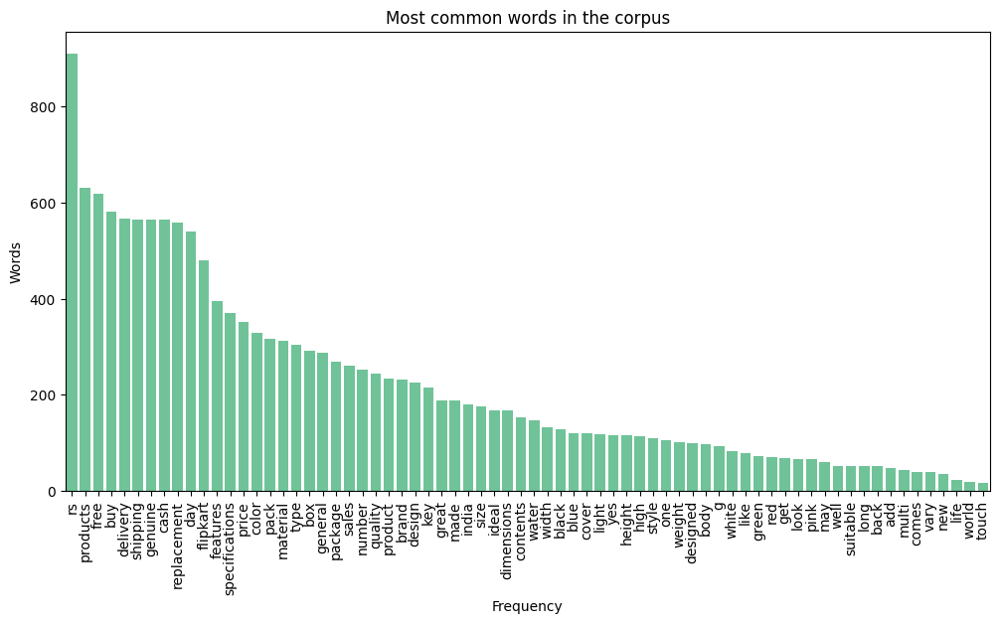

In [66]:
# Frequency of each words in the corpus
corpus_common_token = common_tokens_df.groupby('token')['frequency'].sum().sort_values(ascending=False)
# Plot the most common words in the corpus
plt.figure(figsize=(12, 6))
sns.barplot(x='token', y='frequency', color=COLOR, data=corpus_common_token.reset_index())
plt.title('Most common words in the corpus')
plt.xticks(rotation=90)
plt.xlabel('Frequency')
plt.ylabel('Words')
plt.show()

Common words of the corpus don't seem to give relevant indication for a classification. We decide to drop these words. In the same approach, we will consider that words present in at least half of the categories won't help us in the classification.

In [68]:
filtered_stop_common_tokens_frequency = tokens_df[tokens_df['token'].isin(tokens_per_category['filtered_token_common_out'].explode())]
filtered_stop_common_tokens_frequency

,category,token,frequency
3,Home Furnishing,elegance,5
4,Home Furnishing,polyester,61
5,Home Furnishing,multicolor,54
6,Home Furnishing,abstract,36
7,Home Furnishing,eyelet,44
...,...,...,...
9060,Computers,feather,4
9061,Computers,despicable,4
9063,Computers,looking,4
9064,Computers,upwards,4


In [69]:
# count the number of categories in which each token appears
tokens_count = filtered_stop_common_tokens_frequency['token'].value_counts()
token_common_to_at_least_3_cat = tokens_count[tokens_count >= 3].index.tolist()
len(token_common_to_at_least_3_cat)

675

In [70]:
# Keep only tokens that appear in at less than 3 categories
selected_tokens = filtered_stop_common_tokens_frequency[~filtered_stop_common_tokens_frequency['token'].isin(token_common_to_at_least_3_cat)]
selected_tokens['token'].value_counts()

token
understanding    2
leather          2
movement         2
quartz           2
swiss            2
                ..
haveli           1
rajasthani       1
chowkidar        1
statues          1
bull             1
Name: count, Length: 4652, dtype: int64

### Word cloud after common words filtering

In [71]:
selected_tokens

,category,token,frequency
7,Home Furnishing,eyelet,44
9,Home Furnishing,curtain,42
21,Home Furnishing,interiors,7
31,Home Furnishing,stitch,2
38,Home Furnishing,romantic,1
...,...,...,...
9059,Computers,peacock,4
9060,Computers,feather,4
9061,Computers,despicable,4
9064,Computers,upwards,4


In [72]:
# number of unique tokens
unique_tokens = len(selected_tokens['token'].unique())
print(f'There are {unique_tokens} unique tokens in the dataset after removing common tokens')

There are 4652 unique tokens in the dataset after removing common tokens


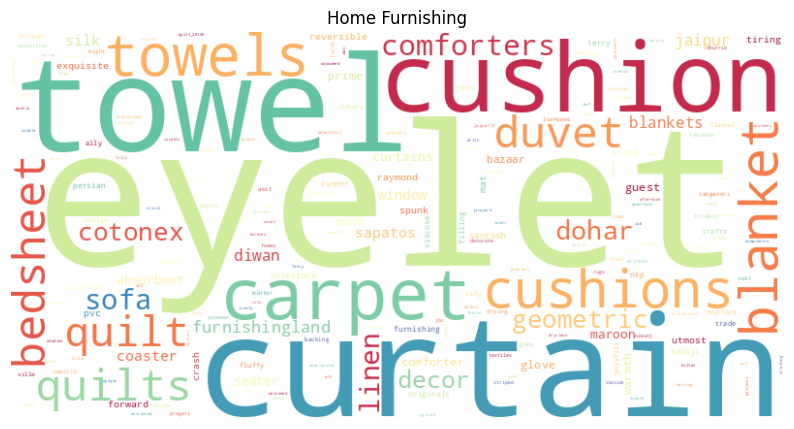

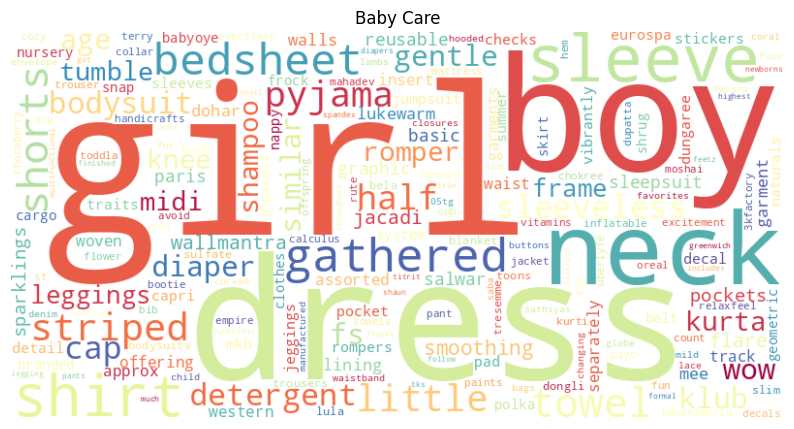

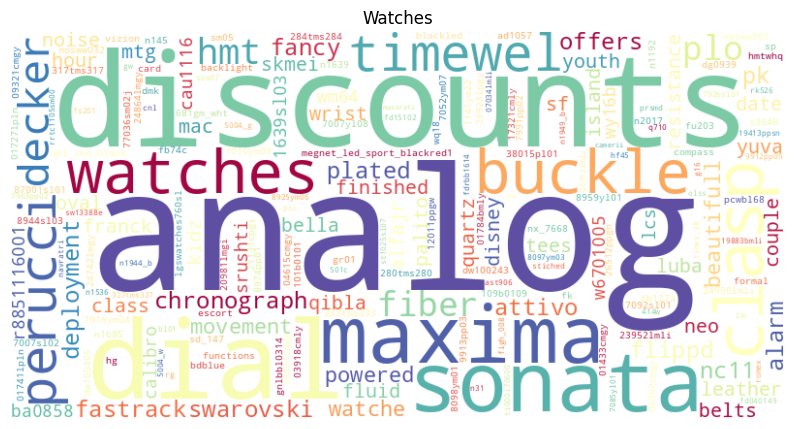

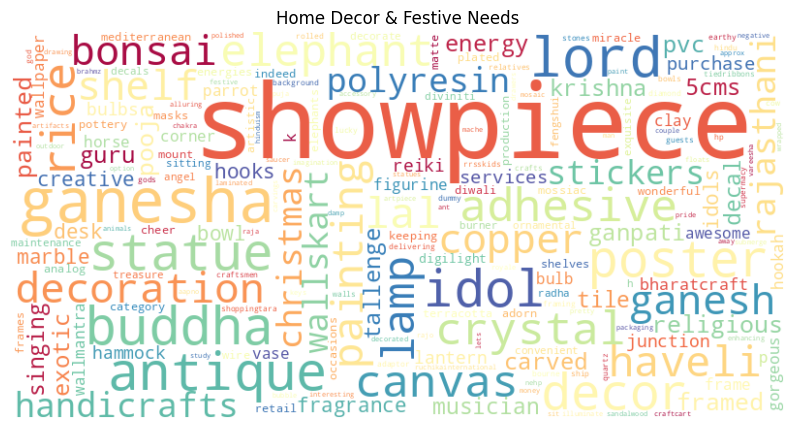

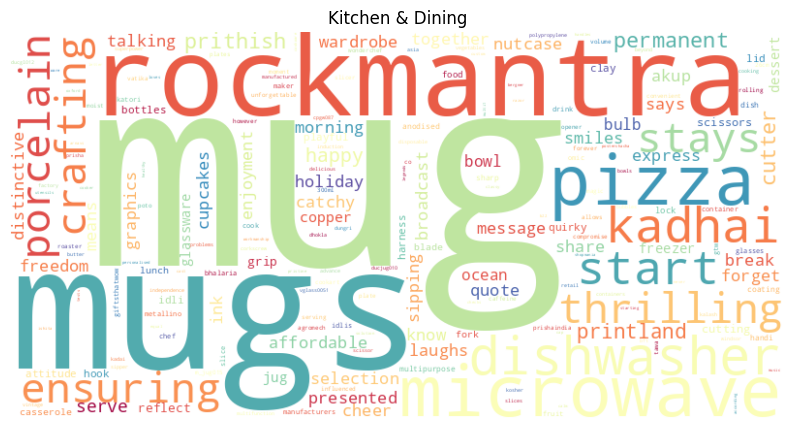

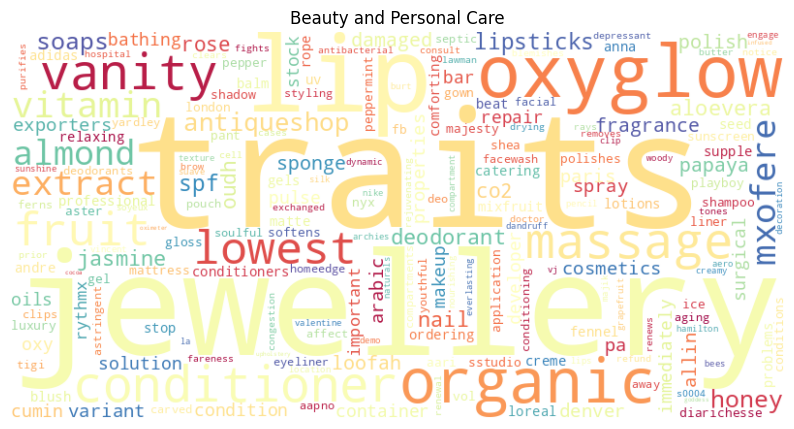

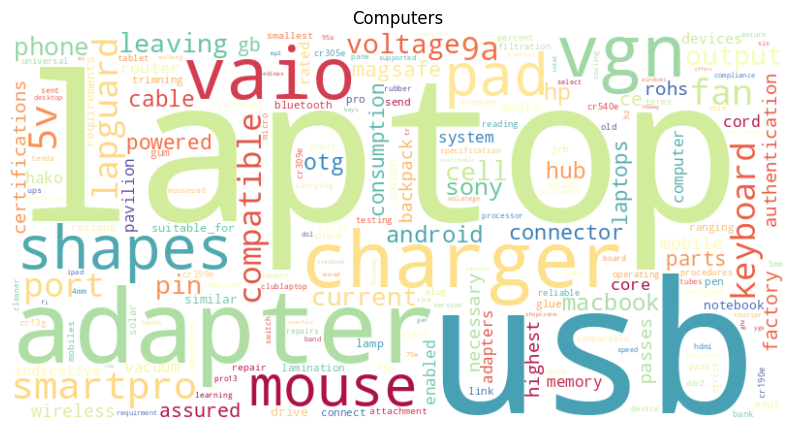

In [73]:
for cat in selected_tokens['category'].unique():
    # Filter on current category
    category_df = selected_tokens[selected_tokens['category'] == cat]

    # Make a dictionnary of words frequency
    token_dict = dict(zip(category_df['token'], category_df['frequency']))

    # Instanciate the WordCloud
    wc = WordCloud(background_color='white', width=800, height=400, colormap='Spectral')
    wc.generate_from_frequencies(token_dict)

    # Plot the WordCloud
    plt.figure(figsize=(10, 6))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.title(cat)
    plt.show()

Observing left tokens, we notice that words can be similar. This is obvious in Kitchen & Dining category where ones of most frequent tokens are mug and mugs. In Natural Language Processing, we have several methods to limit words to tehir root or most common basis and this will be our next step.

### List of stopwords

In [116]:
print(f'Number of english language stopwords: {len(stopwords_list)}')
print(f'Number of tokens in all categories: {len(common_tokens)}')
print(f'Number of tokens in at least 3 catgories: {len(token_common_to_at_least_3_cat)}')

Number of english language stopwords: 179
Number of tokens in all categories: 70
Number of tokens in at least 3 catgories: 675


In [122]:
# make a corpus related stopwords list
corpus_stopwords = set(stopwords_list + list(common_tokens) + list(token_common_to_at_least_3_cat))
print(f'Number of tokens in the corpus stopwords list: {len(corpus_stopwords)}')
common = set(list(common_tokens) + stopwords_list)
cat_3 = set(list(token_common_to_at_least_3_cat) + stopwords_list)
stopwords_strategy = [stopwords_list, common, cat_3, corpus_stopwords]

Number of tokens in the corpus stopwords list: 924


In [78]:
tokens_per_category['filtered_token_common_3_cat'] = tokens_per_category['filtered_token'].apply(lambda x: [token for token in x if token.lower() not in corpus_stopwords])

In [84]:

df_clean_stop = tokens_per_category[['category', 'filtered_token']]
df_clean_common_all_cat = tokens_per_category[['category', 'filtered_token_common_out']]
df_clean_common_3_cat = tokens_per_category[['category', 'filtered_token_common_3_cat']]

# Rename columns
df_clean_stop.columns = ['category', 'tokens']
df_clean_common_all_cat.columns = ['category', 'tokens']
df_clean_common_3_cat.columns = ['category', 'tokens']

list_of_df = [df_clean_stop, df_clean_common_all_cat, df_clean_common_3_cat]
filter_strategies = ['stopwords', 'common words to all categories', 'common words to at least 3 categories']

In [94]:
# Create a dataframe to store the results
results = pd.DataFrame(
    columns=['strategy', 'total_tokens'],
    data=[[filter_strategies[i], len(df['tokens'].explode().unique())] for i, df in enumerate(list_of_df)]
)
results


,strategy,total_tokens
0,stopwords,5397
1,common words to all categories,5327
2,common words to at least 3 categories,4652


## Words reduction

In Natural Language Processing, there are several ways to reduce a word to its essence :
- *Stemming* : Consists in getting rid of the prefixes and suffixes
- *Lemmatization*: Fonds words root

Using these methods will help in reducing the data in the corpus and lower the noise send to the model. The model will then become more robust and data will have more uniformity.

### Stemming

Removes the suffix of a word based on the assumption that different word forms consist of a stem and an ending. It does not care if the root is a real word or not.

These methods have the advantage to be fast to compute.

The most common method is to use the Porter Stemming Algorithm. It removes the suffixes from an English word and obtain its stem.

However,it exists a better version of the Porter Stemming Algorithm that fix some issues of the first version : Snowball Stemmer. The Snowball Stemming is more aggressive thant Porter Stemmer.

Drawbacks of Stemmings :
- overstemming or understemming may lead to inappropriate, unmeaningful stems
- does not consider the way the word is used in the sentence and could be a verb or a noun depending on the context (ex: 'saw')

In [76]:
from nltk.stem.snowball import SnowballStemmer

def stem_tokens(tokens: list[str], stemmer) -> list[str]:
    """ Stem a list of tokens using a stemmer
    Args:
        tokens (list): list of tokens
        stemmer (object): stemmer object
    Returns:
        list: list of stemmed tokens
    """
    # Instanciate the stemmer
    stemmer = stemmer
    stemmed_tokens = [stemmer.stem(token) for token in tokens]
    return stemmed_tokens

In [97]:
for df in list_of_df:
    df['stemmed_token'] = df.apply(lambda x: stem_tokens(x['tokens'], SnowballStemmer('english')), axis=1)
    # get unique tokens for each category
    df['stemmed_token'] = df['stemmed_token'].apply(lambda x: list(set(x)))
    # Get a list of all unique stemmed tokens
    stemmed_tokens = df['stemmed_token'].explode().unique()

    # Save into the results dataframe
    results['stemming'] = len(stemmed_tokens)

results

/var/folders/4f/ml64c07d1zsg_jvvydhyltjr0000gn/T/ipykernel_2510/2864501142.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['stemmed_token'] = df.apply(lambda x: stem_tokens(x['tokens'], SnowballStemmer('english')), axis=1)
/var/folders/4f/ml64c07d1zsg_jvvydhyltjr0000gn/T/ipykernel_2510/2864501142.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['stemmed_token'] = df['stemmed_token'].apply(lambda x: list(set(x)))


,strategy,total_tokens,stemming,lemmatization
0,stopwords,5397,4022,4268
1,common words to all categories,5327,4022,4268
2,common words to at least 3 categories,4652,4022,4268


### Lemmatization

Similar to stemming, it is a smarter algorithm as it results in understandable root forms. A **lemma** is the **canonical form** of a word.

It exists several lemmatization methods. The most common and opensource alternative is **wordnet** that aims to establish structured semantic relationships between words.
WordNet is more proficient when providing the appropriate Part Of Speech of the word.

**n-grams** are words grouped.

**TexxtBlob** is a powerful, fast and convenient NLP package as well. Using the Word and TextBlob objects, its quite straighforward to parse and lemmatize words and sentences respectively.

In [86]:
from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet
# Wordnet
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger_eng')
nltk.download('omw-1.4')

[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/ikusawalaetitia/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     /Users/ikusawalaetitia/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger_eng is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     /Users/ikusawalaetitia/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


True

In [87]:
def get_wordnet_pos(word):
    """ Map POS tag to first character lemmatize() accepts
    Args:
        word (str): word to map
    Returns:
        str: mapped word
    """
    tag = nltk.pos_tag([word])[0][1][0].upper()
    tag_dict = {"J": wordnet.ADJ,
                "N": wordnet.NOUN,
                "V": wordnet.VERB,
                "R": wordnet.ADV}
    return tag_dict.get(tag, wordnet.NOUN)

def lemmatize_tokens(tokens: list[str], lemmatizer = WordNetLemmatizer()) -> list[str]:
    """ Lemmatize a list of tokens using a defined lemmatizer
    Args:
        tokens (list): list of tokens
        lemmatizer (object): lemmatizer object (default: WordNetLemmatizer)
    Returns:
        list: list of lemmatized tokens
    """
    lemmatized_tokens = [lemmatizer.lemmatize(token, get_wordnet_pos(token)) for token in tokens]
    return lemmatized_tokens

In [99]:
for df in list_of_df:
    # Lemmatize tokens
    df['lemmatized_token'] = df.apply(lambda x: lemmatize_tokens(x['tokens']), axis=1)
    # get unique tokens for each category
    df['lemmatized_token'] = df['lemmatized_token'].apply(lambda x: list(set(x)))
    # Get a list of all unique lemmatized tokens
    lemmatized_tokens = df['lemmatized_token'].explode().unique()

    results['lemmatization'] = len(lemmatized_tokens)

results

/var/folders/4f/ml64c07d1zsg_jvvydhyltjr0000gn/T/ipykernel_2510/2807599314.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['lemmatized_token'] = df.apply(lambda x: lemmatize_tokens(x['tokens']), axis=1)
/var/folders/4f/ml64c07d1zsg_jvvydhyltjr0000gn/T/ipykernel_2510/2807599314.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['lemmatized_token'] = df['lemmatized_token'].apply(lambda x: list(set(x)))


,strategy,total_tokens,stemming,lemmatization
0,stopwords,5397,4022,4268
1,common words to all categories,5327,4022,4268
2,common words to at least 3 categories,4652,4022,4268


In [102]:
# compare result for a cateogry between stemmed and lemmatized tokens
for df in list_of_df:
    category = 'Baby Care'
    print(f'Category: {category}')
    # Print the unique tokens for lemmatized and stemmed tokens
    print(f'Unique tokens for stemmed tokens: {df[df["category"] == category]["stemmed_token"].values[0]}')
    print(f'Unique tokens for lemmatized tokens: {df[df["category"] == category]["lemmatized_token"].values[0]}')


Category: Baby Care
Unique tokens for stemmed tokens: ['maintain', 'knee', 'huge', 'conscious', 'tumbl', 'water', 'hook', 'machin', '88ebtsh0565', 'dimens', 'pyjamaset', 'zipper', 'toddla', 'pink', 'pant', 'tshirt', 'design', 'perceiv', 'straight', 'wring', 'display', 'g', 'stone', 'coffe', 'check', 'much', 'multicolour', 'tc', 'breast', 'swampi', 'blue', 'separ', 'suscept', 'shop', 'one', 'faq', 'photo', 'fold', 'terri', 'cor', 'make', 'rectangular', 'nappi', 'hosieri', 'ever', 'aroma', 'centuri', 'princess', 'girli', 'irrit', 'read', 'white', 'complet', 'final', 'bag', 'favorit', 'due', 'literid', 'seri', 'safari', 'compaingn', 'rest', 'excit', 'wet', 'vitamin', 'packag', 'month', 'deliveri', 'wink', 'e', 'surfac', 'addit', 'perfect', 'short', 'ceremoni', 'reuseabl', 'north', 'reduc', 'film', 'allov', 'sleeveless', 'squar', 'antra', 'stitch', 'handl', 'heavi', 'ml', 'rock', 'basra', 'cloth', 'gown', 'cal', 'famili', 'rainbow', 'certain', 'import', 'chinmay', 'curl', 'red', 'frill', '

# FEATURES EXTRACTION

To provide our machine learning model with appropriate data, we need to select the features and transform them in the appropriate type. Machine Learning models accept numeral values as inputs and the goal here will be to **vectorize** the tokens. A **vectorization** will transform tokens into a vector and a text into a matix.

In order to test several feature extractions methods, we will set functions to preprocess the corpus and see how the different approches affects the classification algorithm.

## Functions

### Pre-processing

In [109]:
def preprocess_doc(doc: str, tokenizer:object=RegexpTokenizer(r'\b\w*[a-zA-Z]+\w*\b|\b[a-zA-Z]+\b'), stopwords: list[str]=corpus_stopwords, stemmer: object=None, lemmatizer: object=None) -> pd.Series:
    """ Preprocess a document
    Args:
        doc (pd.Series): document to preprocess
        tokenizer (object): tokenizer object (default: RegexpTokenizer)
        stopwords (list): list of stopwords (default: corpus_stopwords)
        stemmer (object): stemmer object (default: None)
        lemmatizer (object): lemmatizer object (default: None)
    Returns:
        pd.Series: preprocessed document
    """
    # Normalize to lowercase
    lowered_doc = doc.str.lower()

    # Tokenize
    tokenized_doc = lowered_doc.apply(lambda x: tokenizer.tokenize(x))

    # Remove stopwords
    filtered_doc = tokenized_doc.apply(lambda x: [token for token in x if token.lower() not in stopwords])

    # Stem
    if stemmer:
        cleaned_doc = filtered_doc.apply(lambda x: [stemmer.stem(token) for token in x])

    # Lemmatize
    elif lemmatizer:
        cleaned_doc = filtered_doc.apply(lambda x: [lemmatizer.lemmatize(token, get_wordnet_pos(token)) for token in x])

    else:
        cleaned_doc = filtered_doc

    # get unique values and Join tokens
    # cleaned_doc = cleaned_doc.apply(lambda x: list(set(x)))
    cleaned_doc = cleaned_doc.apply(lambda x: ' '.join(x))

    return cleaned_doc

### Evaluation

t-SNE (t-Distributed Stochastic Neighbor Embedding) is a machine learning algorithm for dimensionality reduction. It is particularly well-suited for visualizing high-dimensional datasets by reducing them to two or three dimensions. Here are the key points about t-SNE:

<ins>Dimensionality Reduction</ins>: t-SNE reduces the number of dimensions while preserving the structure of the data as much as possible.

<ins>Non-linear</ins>: Unlike PCA (Principal Component Analysis), t-SNE is a non-linear technique, which means it can capture more complex relationships in the data.

<ins>Visualization</ins>: It is commonly used for visualizing high-dimensional data in a 2D or 3D space, making it easier to identify patterns, clusters, and outliers.

<ins>Probabilistic Approach</ins>: t-SNE converts similarities between data points to joint probabilities and tries to minimize the Kullback-Leibler divergence between these joint probabilities in the high-dimensional and low-dimensional spaces.

In [161]:
def ARI_score(features, y_cat_num):
    """ Compute the Adjusted Rand Index for a given set of features
    Args:
        features (pd.DataFrame): features to compute the ARI
    Returns:
        float: Adjusted Rand Index
    """
    start = time.time()
    num_labels = len(categories)
    tsne = manifold.TSNE(n_components=2, init='random', random_state=42)
    X_tsne = tsne.fit_transform(features)

    # Define clusters from data after t-SNE
    kmeans = KMeans(n_clusters=num_labels, random_state=42)
    kmeans.fit(X_tsne)
    kmeans_labels = kmeans.labels_

    # map labels to original categories
    y_cat_num = y_cat_num.astype(int)

    ari = np.round(adjusted_rand_score(y_cat_num, kmeans_labels), 4)
    duration = np.round(time.time() - start, 0)
    print(f'ARI: {ari} | Duration: {duration} seconds')

    return ari, X_tsne, kmeans_labels

def map_labels(true_labels, predict_labels):
    """ Map labels to original categories
    https://stackoverflow.com/questions/63433244/how-to-matching-labels-cluster-with-true-labels-with-k-means-using-python
    Args:
        categories (list): list of categories
        clusters (np.array): cluster labels
    Returns:
        np.array: mapped labels
    """
    cluster_to_category = {}
    for cluster in np.unique(predict_labels):
        # Get original labels for the current cluster
        cluster_indices = np.where(predict_labels == cluster)[0]
        cluster_original_labels = true_labels.iloc[cluster_indices]

        # Get the most common label in the current cluster
        most_common_label = Counter(cluster_original_labels).most_common(1)[0][0]
        cluster_to_category[cluster] = most_common_label
        predict_cat = np.array([cluster_to_category[label] for label in predict_labels])

    # Map labels
    return pd.Series(predict_cat, index=true_labels.index)

def plot_clusters(X_tsne, original_labels, labels, ari, title=None):
    """ Plot clusters
    Args:
        X_tsne (np.array): t-SNE features
        original_labels (pd.Series): original labels
        labels (np.array): cluster labels
        ari (str): ARI score
    """

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    fig.suptitle(title)
    # mapped_labels = map_labels(original_labels, labels)
    # print(original_labels)
    # print(mapped_labels)
    # Original labels
    scatter1 = sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1], hue=original_labels, palette='tab20', ax=ax1)
    ax1.legend(title='Real categories labels')
    # scatter1 = ax1.scatter(x=X_tsne[:, 0], y=X_tsne[:, 1], c=y_cat_num)
    # ax1.legend(handles=scatter1.legend_elements()[0], labels=original_labels)
    ax1.set_title("Real categories labels")

    # Cluster labels
    scatter2 = sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1], hue=labels, palette='tab20', ax=ax2)
    ax2.legend(title='Clusters labels')
    # scatter2 = ax2.scatter(x=X_tsne[:, 0], y=X_tsne[:, 1], c=labels)
    # ax2.legend(handles=scatter2.legend_elements()[0], title='Clusters', labels=mapped_labels)
    ax2.set_title("Clusters labels")

    plt.show()
    print(f"ARI: {ari}")

## Data

In [105]:
nltk.download('punkt')
nltk.download('punkt_tab')

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/ikusawalaetitia/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to
[nltk_data]     /Users/ikusawalaetitia/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


True

In [141]:
# Concatenate all subcategories
df_cat['subcategories'] = df_cat.filter(like='subcategory_').apply(lambda x: ','.join(x.dropna()), axis=1)
df_prep = df_cat.drop(columns=df_cat.filter(like='subcategory_'))
df_prep = df_prep[['uniq_id', 'product_name', 'description', 'main_category']]
# Transform the main category to a numerical value
categories_list = list(set(df_prep['main_category']))
num_categories = {category: i for i, category in enumerate(categories_list)}
print('associations :', num_categories)
# Add a numerical category column
df_prep['category_code'] = df_prep['main_category'].map(num_categories)
y_cat_num = df_prep['category_code'].values
display(df_prep.head())

associations : {'Home Furnishing': 0, 'Home Decor & Festive Needs': 1, 'Watches': 2, 'Beauty and Personal Care': 3, 'Kitchen & Dining': 4, 'Baby Care': 5, 'Computers': 6}


,uniq_id,product_name,description,main_category,category_code
0,55b85ea15a1536d46b7190ad6fff8ce7,Elegance Polyester Multicolor Abstract Eyelet ...,Key Features of Elegance Polyester Multicolor ...,Home Furnishing,0
1,7b72c92c2f6c40268628ec5f14c6d590,Sathiyas Cotton Bath Towel,Specifications of Sathiyas Cotton Bath Towel (...,Baby Care,5
2,64d5d4a258243731dc7bbb1eef49ad74,Eurospa Cotton Terry Face Towel Set,Key Features of Eurospa Cotton Terry Face Towe...,Baby Care,5
3,d4684dcdc759dd9cdf41504698d737d8,SANTOSH ROYAL FASHION Cotton Printed King size...,Key Features of SANTOSH ROYAL FASHION Cotton P...,Home Furnishing,0
4,6325b6870c54cd47be6ebfbffa620ec7,Jaipur Print Cotton Floral King sized Double B...,Key Features of Jaipur Print Cotton Floral Kin...,Home Furnishing,0


In [142]:
for selected_stopwords, strategy in zip(stopwords_strategy, ['stopwords', 'all_common', '3_cat_common', 'all']):
    # Stem the description
    df_prep[f'stem_{strategy}'] = preprocess_doc(df_prep['description'], stopwords=selected_stopwords, stemmer=SnowballStemmer('english'))
    # Lemmatize the description : wordnet lemmatizer
    df_prep[f'lemma_{strategy}'] = preprocess_doc(df_prep['description'], stopwords=selected_stopwords, lemmatizer=WordNetLemmatizer())

df_prep.head()

,uniq_id,product_name,description,main_category,category_code,stem_stopwords,lemma_stopwords,stem_all_common,lemma_all_common,stem_3_cat_common,lemma_3_cat_common,stem_all,lemma_all
0,55b85ea15a1536d46b7190ad6fff8ce7,Elegance Polyester Multicolor Abstract Eyelet ...,Key Features of Elegance Polyester Multicolor ...,Home Furnishing,0,key featur eleg polyest multicolor abstract ey...,key feature elegance polyester multicolor abst...,eleg polyest multicolor abstract eyelet door c...,elegance polyester multicolor abstract eyelet ...,key featur eyelet curtain curtain eyelet curta...,key feature eyelet curtain curtain eyelet curt...,eyelet curtain curtain eyelet curtain curtain ...,eyelet curtain curtain eyelet curtain curtain ...
1,7b72c92c2f6c40268628ec5f14c6d590,Sathiyas Cotton Bath Towel,Specifications of Sathiyas Cotton Bath Towel (...,Baby Care,5,specif sathiya cotton bath towel bath towel re...,specification sathiyas cotton bath towel bath ...,sathiya cotton bath towel bath towel yellow ba...,sathiyas cotton bath towel bath towel yellow b...,specif sathiya towel towel red blue towel feat...,specification sathiyas towel towel red blue to...,sathiya towel towel towel sathiya towel sathiy...,sathiyas towel towel towel sathiyas towel sath...
2,64d5d4a258243731dc7bbb1eef49ad74,Eurospa Cotton Terry Face Towel Set,Key Features of Eurospa Cotton Terry Face Towe...,Baby Care,5,key featur eurospa cotton terri face towel set...,key feature eurospa cotton terry face towel se...,eurospa cotton terri face towel set small inch...,eurospa cotton terry face towel set small inch...,key featur eurospa terri towel size height eur...,key feature eurospa terry towel size height eu...,eurospa terri towel eurospa terri towel towel ...,eurospa terry towel eurospa terry towel towel ...
3,d4684dcdc759dd9cdf41504698d737d8,SANTOSH ROYAL FASHION Cotton Printed King size...,Key Features of SANTOSH ROYAL FASHION Cotton P...,Home Furnishing,0,key featur santosh royal fashion cotton print ...,key feature santosh royal fashion cotton print...,santosh royal fashion cotton print king size d...,santosh royal fashion cotton print king size d...,key featur santosh size bedsheet bedsheet perf...,key feature santosh size bedsheet bedsheet per...,santosh size bedsheet bedsheet perfact santosh...,santosh size bedsheet bedsheet perfact santosh...
4,6325b6870c54cd47be6ebfbffa620ec7,Jaipur Print Cotton Floral King sized Double B...,Key Features of Jaipur Print Cotton Floral Kin...,Home Furnishing,0,key featur jaipur print cotton floral king siz...,key feature jaipur print cotton floral king si...,jaipur print cotton floral king size doubl bed...,jaipur print cotton floral king size double be...,key featur jaipur size bedsheet jaipur size be...,key feature jaipur size bedsheet jaipur size b...,jaipur size bedsheet jaipur size bedsheet beds...,jaipur size bedsheet jaipur size bedsheet beds...


In [143]:
# select columns starting with stem or lemma
stem_columns = df_prep.filter(like='stem').columns
lemma_columns = df_prep.filter(like='lemma').columns
columns_to_count = stem_columns.append(lemma_columns)

# counting dataframe
count_df = pd.DataFrame(columns=columns_to_count)

# Count the number of tokens in the bag of words
for col in columns_to_count:
    count_df[col] = df_prep[col].apply(lambda x: len(word_tokenize(x)))
    print(f'Max length of the bag of words after {col}:', count_df[col].max())

count_df.head()

Max length of the bag of words after stem_stopwords: 369
Max length of the bag of words after stem_all_common: 297
Max length of the bag of words after stem_3_cat_common: 230
Max length of the bag of words after stem_all: 167
Max length of the bag of words after lemma_stopwords: 369
Max length of the bag of words after lemma_all_common: 297
Max length of the bag of words after lemma_3_cat_common: 230
Max length of the bag of words after lemma_all: 167


,stem_stopwords,stem_all_common,stem_3_cat_common,stem_all,lemma_stopwords,lemma_all_common,lemma_3_cat_common,lemma_all
0,152,117,84,49,152,117,84,49
1,62,37,36,11,62,37,36,11
2,152,112,80,40,152,112,80,40
3,114,87,41,14,114,87,41,14
4,153,113,61,21,153,113,61,21


## Bag of Words

Is a simple method of vectorizing text. It doesn't take in consideration the position of the word in a document but will drop all words into a bag and count the number of occurences of each words in each documents.

This method is commonly used for text classification purposes

### CountVectorizer

**Frequency** : Each document will be split into unique words and the number of rows will be counted.

**Binary** : Check if words in the document figure in the BoW, no matter how often.

Limitations : 
- loss of important information if used in tasks where words order matters (sentiment analysis, language modeling)
- vocabulary has a fixed size, meaning that a new word in test won't be represented unless the vocabulary is updated 
- its sensitivity to stop words can lead to the expulsion of important context-carrying words.
- all words are consider equally important
- matrix can be very sparse, especially when dealing with a large vocabulary (a lot of 0)
- not suitable for semantic analysis

In [174]:
results = pd.DataFrame(columns=['strategy', 'method', 'ARI', 'X_tsne', 'kmeans_labels'])

In [175]:
for col in columns_to_count:
    # print(f"\n\n Strategy: {col}")
    # print("=================")
    # print("CountVectorizer : Stem method")
    # print("-----------------")

    vectorizer = CountVectorizer(stop_words='english', max_df=0.95, min_df=1)

    vec_fit = vectorizer.fit(df_prep[col])
    vec_transform = vec_fit.transform(df_prep[col])

    ARI_stem, X_tsne_stem, labels_stem = ARI_score(vec_transform, y_cat_num)

    # Save to results
    new_row = pd.DataFrame([{'strategy': col, 'method': 'Count', 'ARI': ARI_stem, 'X_tsne': X_tsne_stem, 'kmeans_labels': labels_stem}])
    results = pd.concat([results,new_row], ignore_index=True)

display(results.sort_values(by='ARI', ascending=False))

ARI: 0.4227 | Duration: 1.0 seconds


/var/folders/4f/ml64c07d1zsg_jvvydhyltjr0000gn/T/ipykernel_2510/1034364570.py:16: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results = pd.concat([results,new_row], ignore_index=True)


ARI: 0.3648 | Duration: 1.0 seconds
ARI: 0.2653 | Duration: 1.0 seconds
ARI: 0.2156 | Duration: 1.0 seconds
ARI: 0.431 | Duration: 1.0 seconds
ARI: 0.417 | Duration: 1.0 seconds
ARI: 0.3142 | Duration: 1.0 seconds
ARI: 0.2684 | Duration: 1.0 seconds


,strategy,method,ARI,X_tsne,kmeans_labels
4,lemma_stopwords,Count,0.4310,"[[-5.3394547, -33.656017], [-2.4283843, -3.373...","[1, 3, 3, 1, 1, 4, 4, 3, 4, 4, 4, 4, 4, 4, 4, ..."
0,stem_stopwords,Count,0.4227,"[[-3.1841412, -33.12881], [-3.1541822, -3.0178...","[6, 1, 1, 6, 6, 4, 4, 1, 4, 4, 4, 4, 4, 4, 4, ..."
5,lemma_all_common,Count,0.4170,"[[-18.221119, -26.962778], [-8.105542, 9.62063...","[5, 1, 1, 4, 4, 3, 3, 6, 3, 3, 3, 3, 3, 3, 3, ..."
1,stem_all_common,Count,0.3648,"[[7.042666, -33.26998], [-15.5194845, -0.75286...","[1, 4, 4, 5, 5, 6, 6, 4, 6, 6, 6, 6, 6, 6, 6, ..."
6,lemma_3_cat_common,Count,0.3142,"[[-11.210825, -39.556892], [25.856667, -11.346...","[6, 3, 3, 6, 6, 4, 4, 3, 0, 4, 3, 4, 4, 4, 0, ..."
7,lemma_all,Count,0.2684,"[[45.402706, 7.3051314], [13.690094, 0.2387197...","[3, 6, 6, 1, 1, 4, 4, 6, 6, 4, 4, 4, 4, 4, 6, ..."
2,stem_3_cat_common,Count,0.2653,"[[19.030403, -37.459778], [22.434399, -15.6894...","[3, 2, 2, 3, 3, 6, 6, 1, 0, 6, 2, 6, 6, 6, 0, ..."
3,stem_all,Count,0.2156,"[[4.4477606, 44.94123], [21.51083, 42.422977],...","[2, 2, 2, 6, 6, 4, 4, 0, 0, 4, 4, 4, 4, 4, 0, ..."


After testing several words selection strategies, it seem that using basic stopwords is the most efficient, closely followed by the strategy of getting rid of words common to all categories. Let's keep these results.

In [176]:
# get the best ARI
best_results = results[results['ARI'] >= 0.36]
best_results

,strategy,method,ARI,X_tsne,kmeans_labels
0,stem_stopwords,Count,0.4227,"[[-3.1841412, -33.12881], [-3.1541822, -3.0178...","[6, 1, 1, 6, 6, 4, 4, 1, 4, 4, 4, 4, 4, 4, 4, ..."
1,stem_all_common,Count,0.3648,"[[7.042666, -33.26998], [-15.5194845, -0.75286...","[1, 4, 4, 5, 5, 6, 6, 4, 6, 6, 6, 6, 6, 6, 6, ..."
4,lemma_stopwords,Count,0.4310,"[[-5.3394547, -33.656017], [-2.4283843, -3.373...","[1, 3, 3, 1, 1, 4, 4, 3, 4, 4, 4, 4, 4, 4, 4, ..."
5,lemma_all_common,Count,0.4170,"[[-18.221119, -26.962778], [-8.105542, 9.62063...","[5, 1, 1, 4, 4, 3, 3, 6, 3, 3, 3, 3, 3, 3, 3, ..."


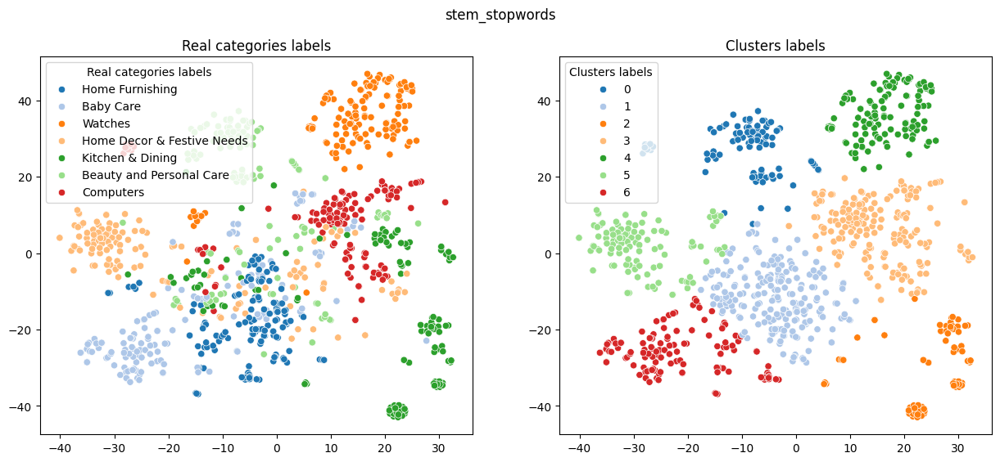

ARI: 0.4227


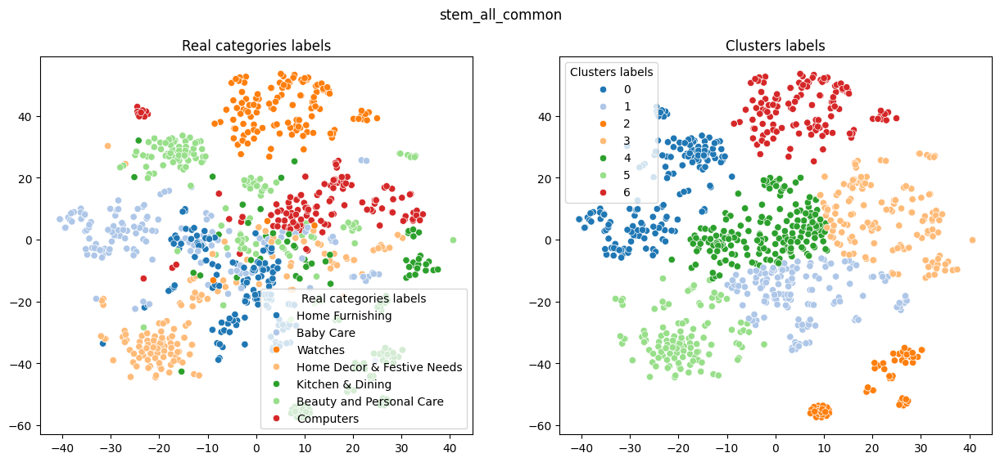

ARI: 0.3648


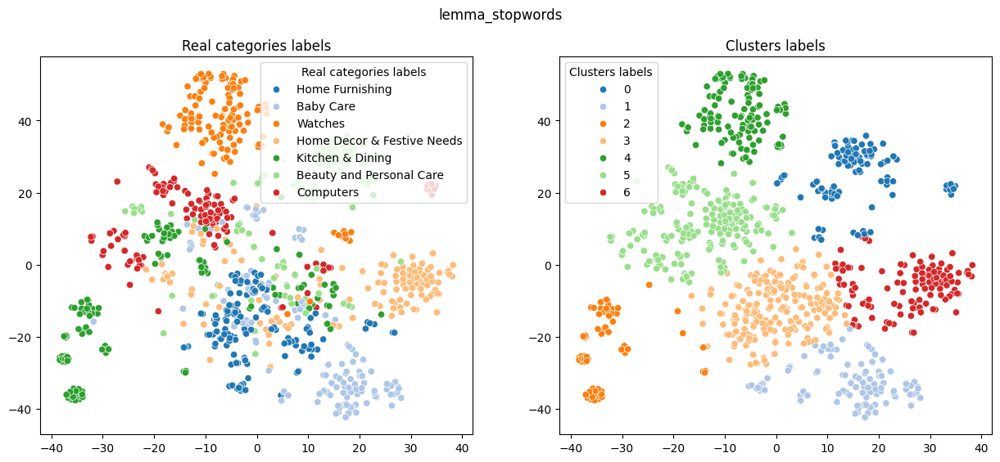

ARI: 0.431


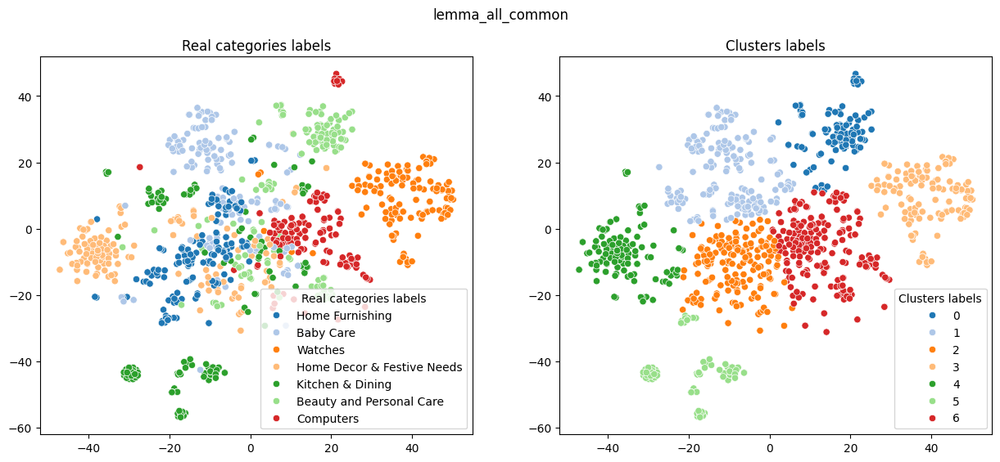

ARI: 0.417


In [162]:
for index, row in best_results.iterrows():
    plot_clusters(row['X_tsne'], df_prep['main_category'], row['kmeans_labels'], row['ARI'], title=row['strategy'])

### TF/IDF

The issue with a simple occurence word count is that some words appear only in a limited number of documents. The model will learn that pattern, overfitt the training data, and fail to generelaize to new texts properly. Similarly, words that are present in all the documents will not bring any information to the classification model.

TF-IDF are word frequency scores that try to highlight words that are more frequent in a document but not accross documents. It will normalize the word counts by the number of time they appear in the documents. It combines :
- **TF (Term Frequency)** : as we did previously,it vectorize the number of time a word appears in a document
- **IDF (Inverse Document Frequency)** : an inverse count of the number of documents a words appears in. It measures how significant a word is in the corpus.

In [177]:
results = best_results
for col in columns_to_count:
    vectorizer = TfidfVectorizer()

    vec_fit = vectorizer.fit(df_prep[col])
    vec_transform = vec_fit.transform(df_prep[col])

    ARI_sc, X_tsne, labels = ARI_score(vec_transform, y_cat_num)

    new_row = pd.DataFrame([{'strategy': col, 'method': 'TF/IDF', 'ARI': ARI_sc, 'X_tsne': X_tsne, 'kmeans_labels': labels}])
    results = pd.concat([results,new_row], ignore_index=True)

display(results.sort_values(by='ARI', ascending=False))

ARI: 0.4347 | Duration: 1.0 seconds
ARI: 0.5243 | Duration: 1.0 seconds
ARI: 0.3618 | Duration: 1.0 seconds
ARI: 0.3734 | Duration: 1.0 seconds
ARI: 0.4232 | Duration: 1.0 seconds
ARI: 0.5184 | Duration: 1.0 seconds
ARI: 0.4275 | Duration: 1.0 seconds
ARI: 0.416 | Duration: 1.0 seconds


,strategy,method,ARI,X_tsne,kmeans_labels
5,stem_all_common,TF/IDF,0.5243,"[[-26.825813, -4.220964], [-12.260504, 22.2140...","[4, 3, 3, 4, 4, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, ..."
9,lemma_all_common,TF/IDF,0.5184,"[[-26.94138, -6.7239995], [-13.119645, 20.4956...","[3, 6, 6, 3, 3, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, ..."
4,stem_stopwords,TF/IDF,0.4347,"[[7.2356305, 23.031767], [12.858523, 0.9764162...","[6, 6, 6, 6, 6, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, ..."
2,lemma_stopwords,Count,0.4310,"[[-5.3394547, -33.656017], [-2.4283843, -3.373...","[1, 3, 3, 1, 1, 4, 4, 3, 4, 4, 4, 4, 4, 4, 4, ..."
10,lemma_3_cat_common,TF/IDF,0.4275,"[[23.025282, 1.7743618], [1.09479, -28.062222]...","[1, 4, 4, 4, 4, 3, 3, 3, 0, 3, 3, 3, 3, 3, 3, ..."
8,lemma_stopwords,TF/IDF,0.4232,"[[9.73308, 22.693542], [8.812195, 0.6982813], ...","[5, 5, 5, 5, 5, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, ..."
0,stem_stopwords,Count,0.4227,"[[-3.1841412, -33.12881], [-3.1541822, -3.0178...","[6, 1, 1, 6, 6, 4, 4, 1, 4, 4, 4, 4, 4, 4, 4, ..."
3,lemma_all_common,Count,0.4170,"[[-18.221119, -26.962778], [-8.105542, 9.62063...","[5, 1, 1, 4, 4, 3, 3, 6, 3, 3, 3, 3, 3, 3, 3, ..."
11,lemma_all,TF/IDF,0.4160,"[[-12.937894, -14.37239], [41.647312, -13.6812...","[5, 3, 3, 0, 0, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, ..."
7,stem_all,TF/IDF,0.3734,"[[-13.029007, 40.9921], [12.141415, -39.603302...","[1, 4, 4, 0, 0, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, ..."


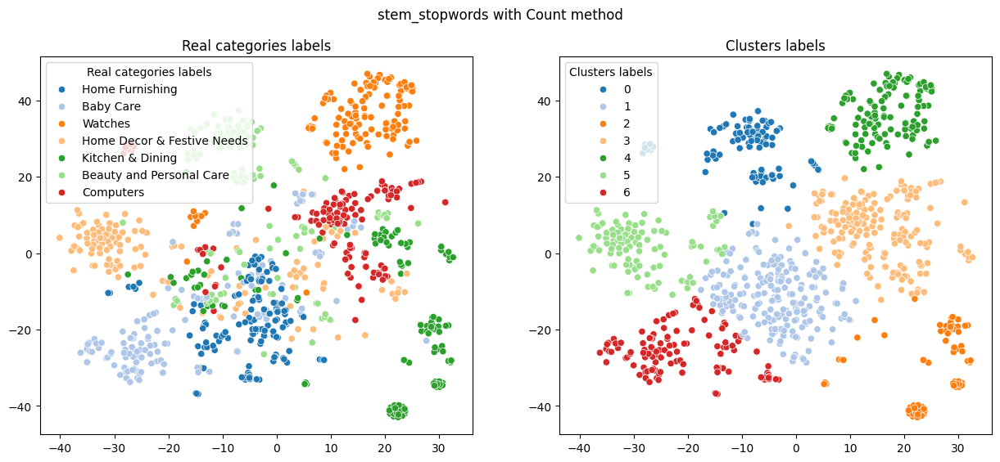

ARI: 0.4227


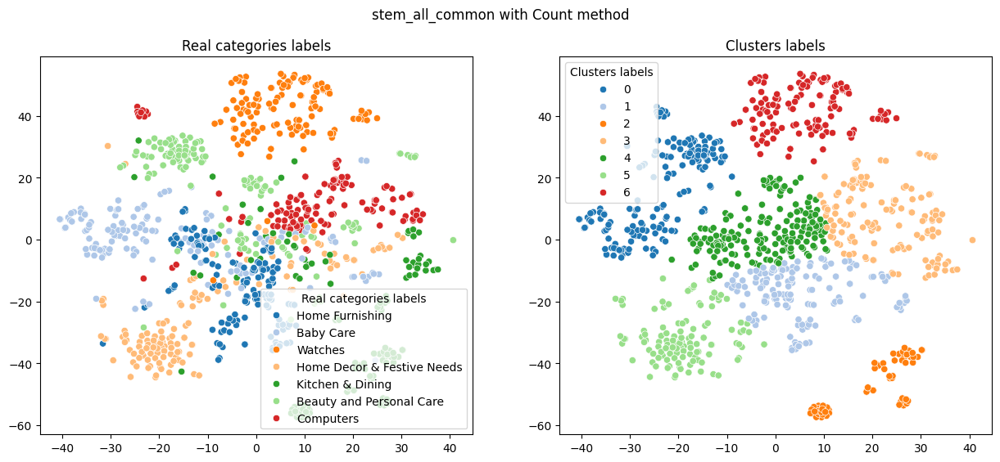

ARI: 0.3648


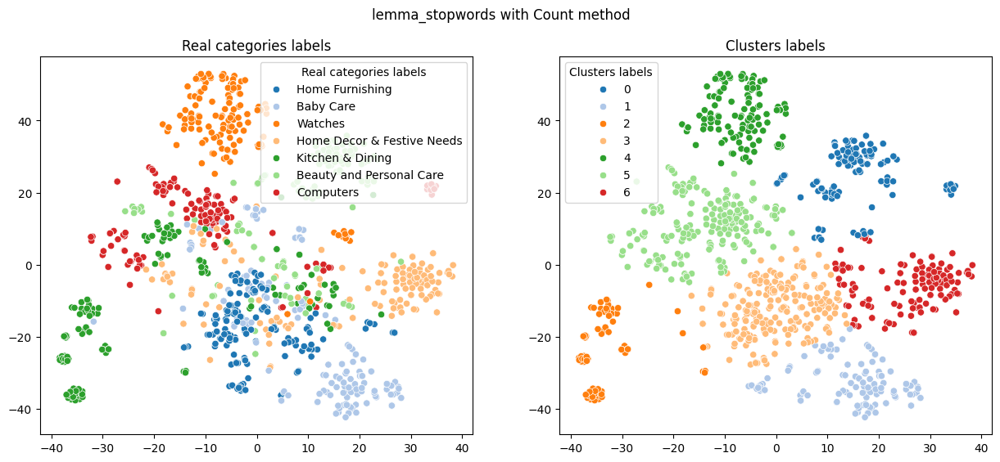

ARI: 0.431


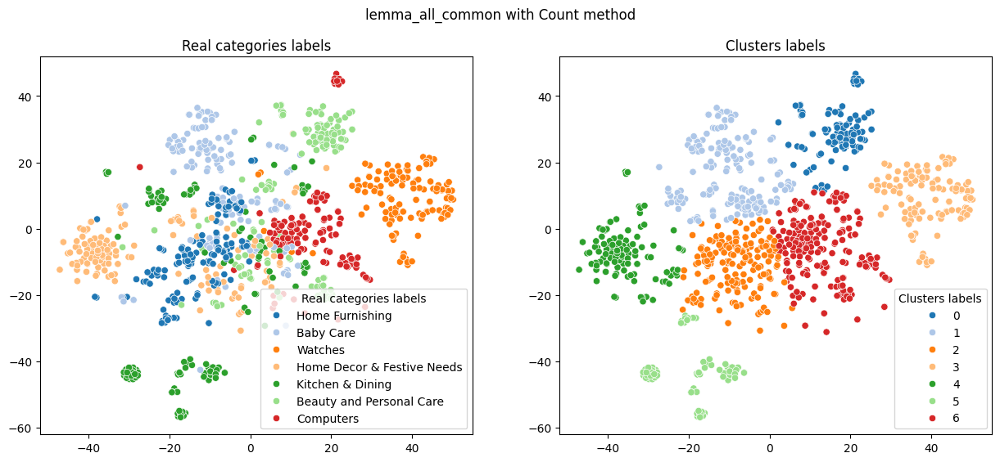

ARI: 0.417


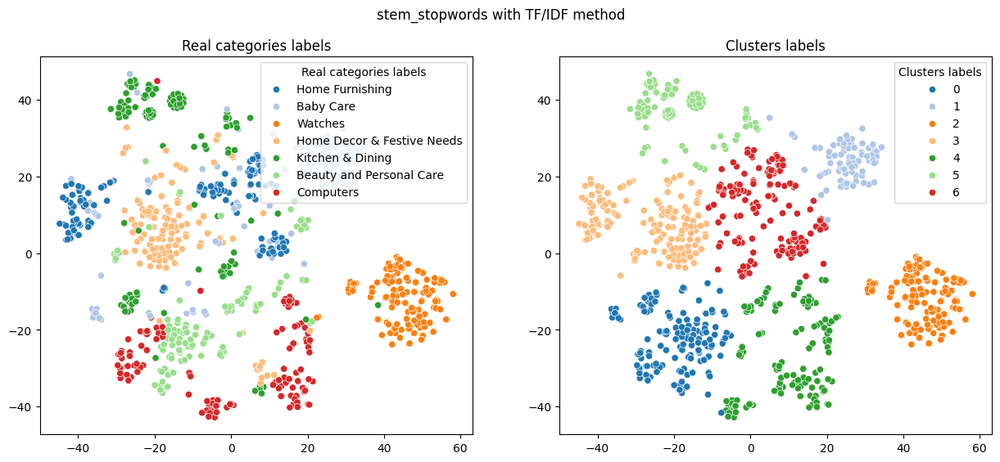

ARI: 0.4347


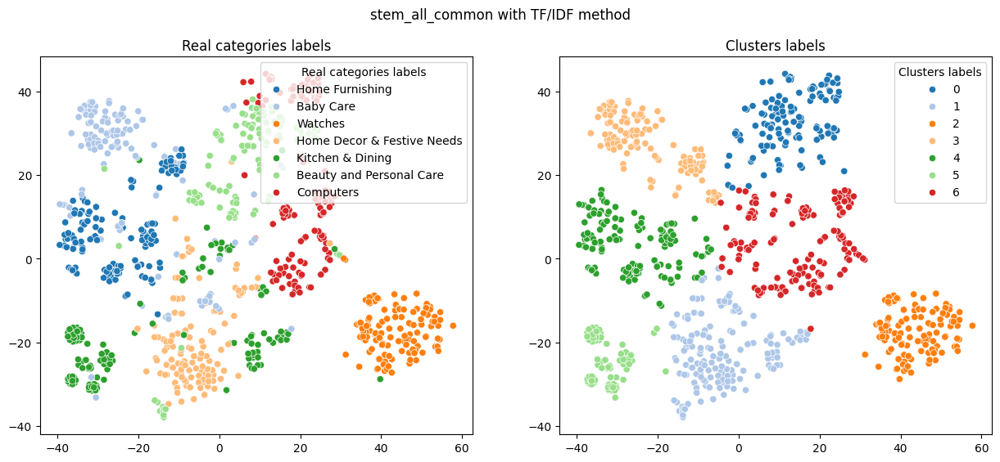

ARI: 0.5243


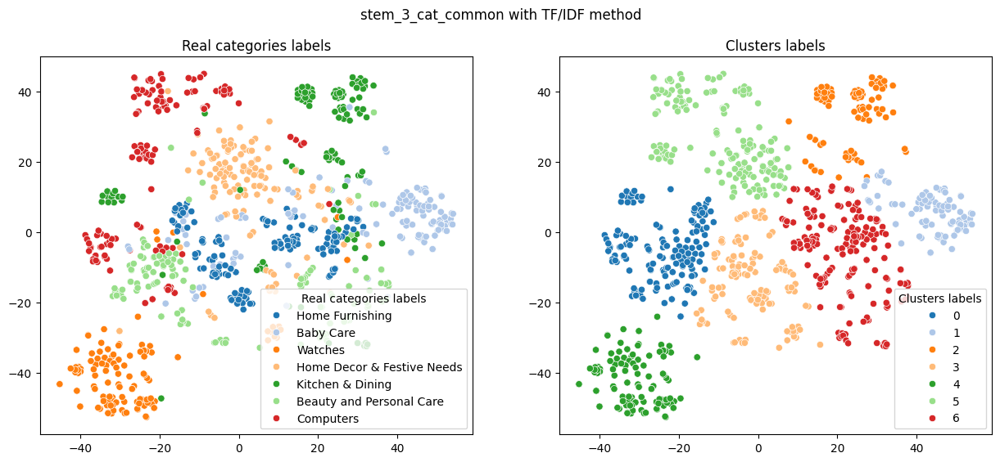

ARI: 0.3618


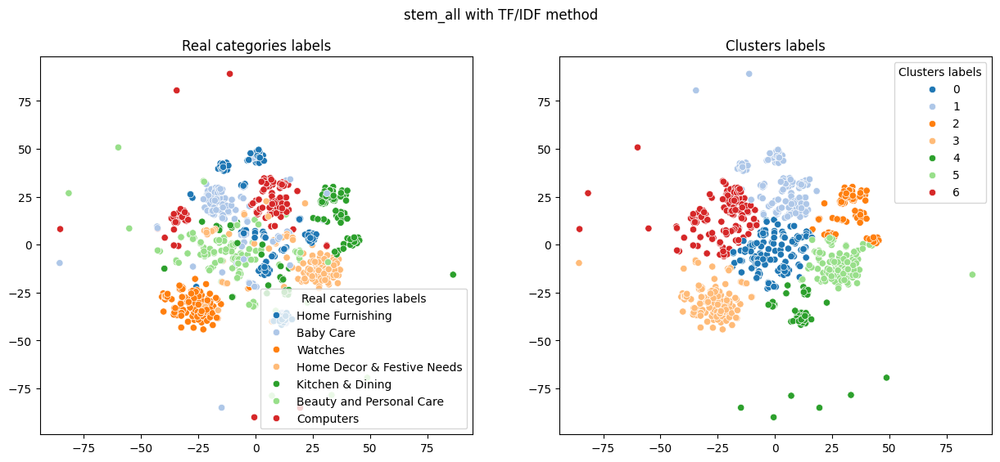

ARI: 0.3734


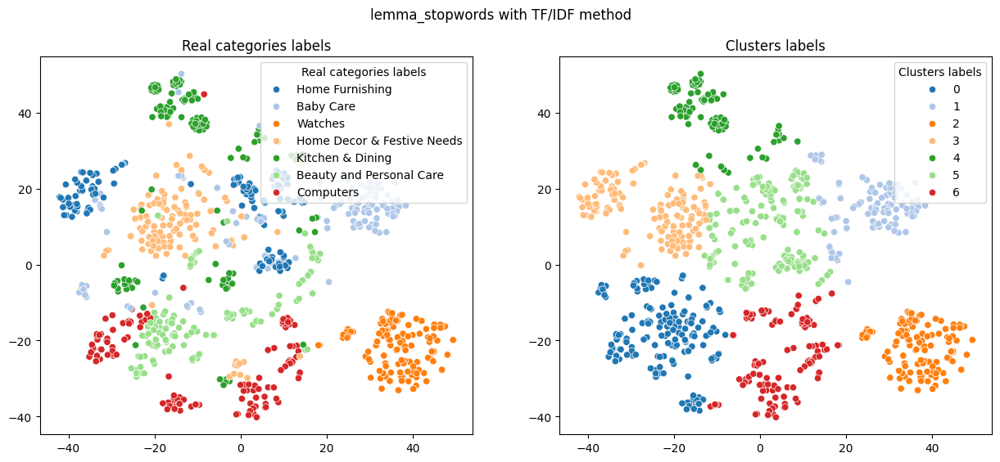

ARI: 0.4232


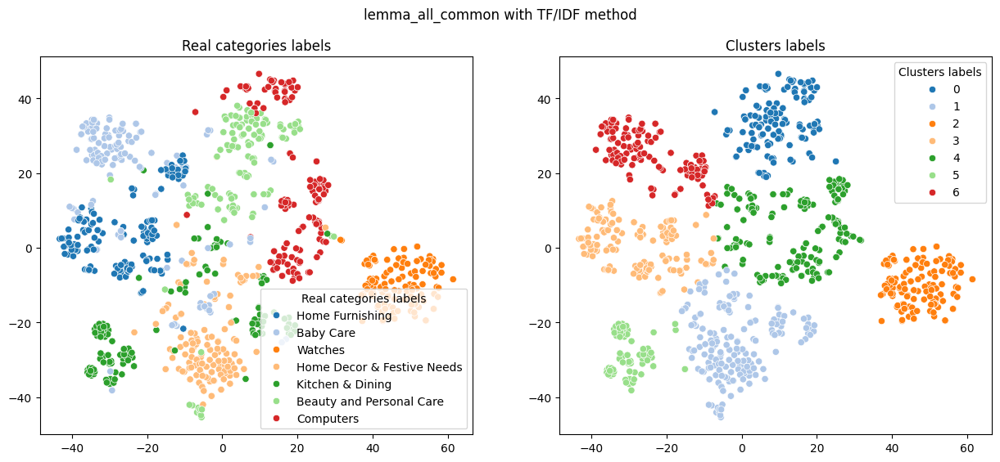

ARI: 0.5184


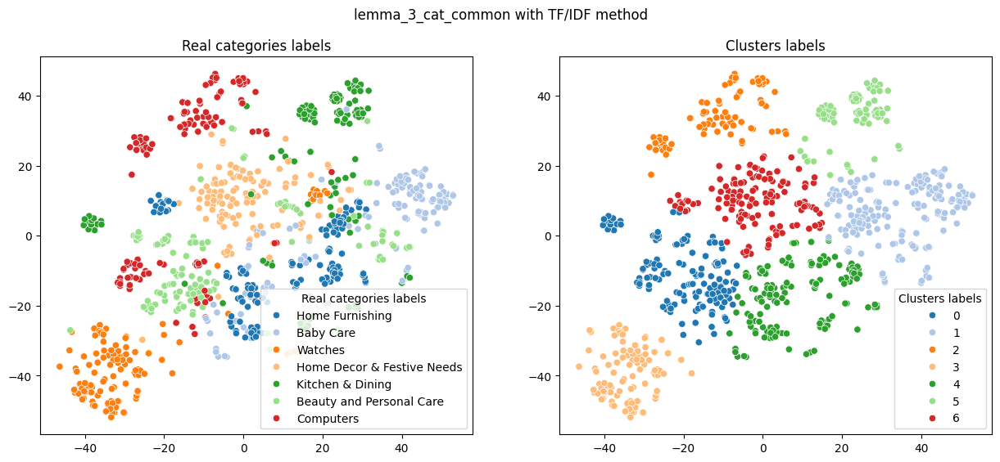

ARI: 0.4275


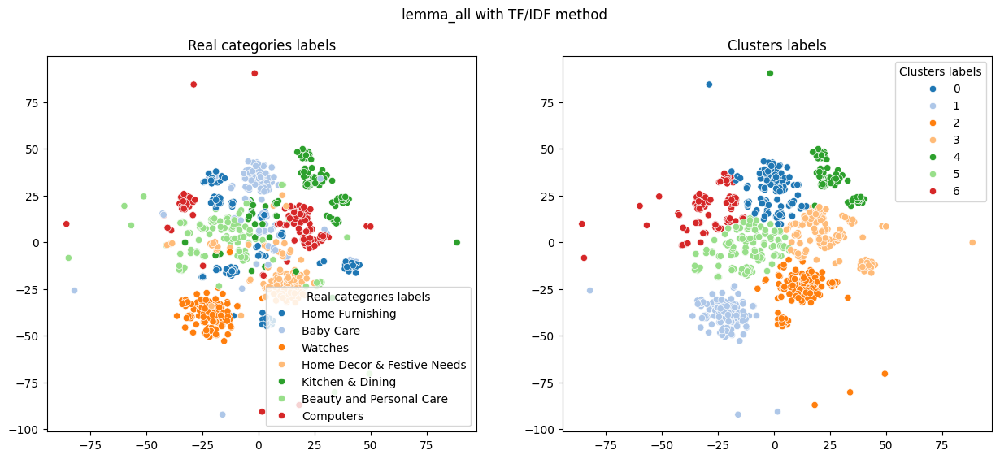

ARI: 0.416


In [179]:
for index, row in results.iterrows():
    plot_clusters(row['X_tsne'], df_prep['main_category'], row['kmeans_labels'], row['ARI'], title=f"{row['strategy']} with {row['method']} method")

## Word embeddings

With word embeddings, each word gets a universal numerical representation associated with its own definition. Each word is represtented by a unique vector independent of the text under consideration. Working with this vectors allow the calculation of the distance between words, a similarity score between pairs, called **semantic similarity** or **semantic distance**.

We xill use **Gensim** NLP package that enable to extract the underlying topics from large volumes of text.

In [180]:
import multiprocessing
cores = multiprocessing.cpu_count() # Count the number of cores in a computer
cores

12

In [181]:
import gensim
df_prep.head(2)

,uniq_id,product_name,description,main_category,category_code,stem_stopwords,lemma_stopwords,stem_all_common,lemma_all_common,stem_3_cat_common,lemma_3_cat_common,stem_all,lemma_all
0,55b85ea15a1536d46b7190ad6fff8ce7,Elegance Polyester Multicolor Abstract Eyelet ...,Key Features of Elegance Polyester Multicolor ...,Home Furnishing,0,key featur eleg polyest multicolor abstract ey...,key feature elegance polyester multicolor abst...,eleg polyest multicolor abstract eyelet door c...,elegance polyester multicolor abstract eyelet ...,key featur eyelet curtain curtain eyelet curta...,key feature eyelet curtain curtain eyelet curt...,eyelet curtain curtain eyelet curtain curtain ...,eyelet curtain curtain eyelet curtain curtain ...
1,7b72c92c2f6c40268628ec5f14c6d590,Sathiyas Cotton Bath Towel,Specifications of Sathiyas Cotton Bath Towel (...,Baby Care,5,specif sathiya cotton bath towel bath towel re...,specification sathiyas cotton bath towel bath ...,sathiya cotton bath towel bath towel yellow ba...,sathiyas cotton bath towel bath towel yellow b...,specif sathiya towel towel red blue towel feat...,specification sathiyas towel towel red blue to...,sathiya towel towel towel sathiya towel sathiy...,sathiyas towel towel towel sathiyas towel sath...


### Word2Vec

Creates a representation of each word present in our vocabulary into a vector. Words used in similars contexts or having semantic relationships are captured effectively through their closeness in the vector space.

In [195]:
from gensim.models import Word2Vec
from gensim.utils import simple_preprocess
from sklearn.decomposition import PCA # for dimensionality reduction

import tensorflow as tf
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.layers import Input, Embedding, GlobalAveragePooling1D
from tensorflow.keras.models import Model

In [186]:
def display_pca_scatterplot(model, words=None, sample=0, title=None):
    """ Display a scatterplot of the words vectors using PCA
    Args:
        model (object): Embedding model
        words (list): list of words to display
        sample (int): number of words to sample
        title (str): title of the plot
    """
    # Get the vocabulary from the model
    vocab = set(model.key_to_index.keys())

    if words is None:
        if sample > 0:
            words = np.random.choice(list(vocab), sample, replace=False)
        else:
            words = list(vocab)
    else:
        # Filter out words not in the model's vocabulary
        words = [word for word in words if word in vocab]
    # Check if there are any words left after filtering
    if not words:
        raise ValueError("No words to display after filtering out words not in the model's vocabulary.")

    word_vectors = np.array([model[w] for w in words])

    twodim = PCA().fit_transform(word_vectors)[:,:2]

    plt.figure(figsize=(6, 6))
    plt.title(title)
    plt.scatter(twodim[:,0], twodim[:,1], edgecolors='k', c='r')
    for word, (x, y) in zip(words, twodim):
        plt.text(x, y, word)

In [185]:
# vector size : size of the word embedding that it would output
w2v_size = 300
# window size : max distance between the current and predicted word within a sentence
w2v_window = 3
# min count : minimum number of occurrences of a word in the corpus to be included in the model
w2v_min_count = 1
# number of iterations (epochs) over the corpus
w2v_epochs = 100
# number of workers to use: parallelization of the training
w2v_workers = 4


In [188]:
list(w2v_model.wv.most_similar('curtain', topn=5))

[('ville', 0.9945546388626099),
 ('kolaveri', 0.9932149052619934),
 ('opaque', 0.9919259548187256),
 ('uplift', 0.9905965924263),
 ('eyelet', 0.9889855980873108)]

Train the Word2Vec model
Working on stem_stopwords:
Time to train the model: 2.10 seconds
Number of words used in the Word2Vec model with stem_stopwords: 4086
Fit Tokenizer
Number of unique words: 4087
Embedding matrix
Word embedding rate: 1.0
Embedding matrix shape: (4087, 300)
Embedding layer


/Users/ikusawalaetitia/Desktop/work/projects/python/P6-txt-img_classification/myenv/lib/python3.10/site-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


Model: "functional_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_19 (InputLayer)     │ (None, 366)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ embedding_9 (Embedding)         │ (None, 366, 300)       │     1,226,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling1d_8      │ (None, 300)            │             0 │
│ (GlobalAveragePooling1D)        │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,226,100 (4.68 MB)

 Trainable params: 1,226,100 (4.68 MB)

 Non-trainable params: 0 (0.00 B)

Execute model
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


/Users/ikusawalaetitia/Desktop/work/projects/python/P6-txt-img_classification/myenv/lib/python3.10/site-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_36']
Received: inputs=Tensor(shape=(32, 366))
  warnings.warn(msg)
/Users/ikusawalaetitia/Desktop/work/projects/python/P6-txt-img_classification/myenv/lib/python3.10/site-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_36']
Received: inputs=Tensor(shape=(None, 366))
  warnings.warn(msg)


Embedding shape: (1050, 300)
ARI: 0.3748 | Duration: 1.0 seconds


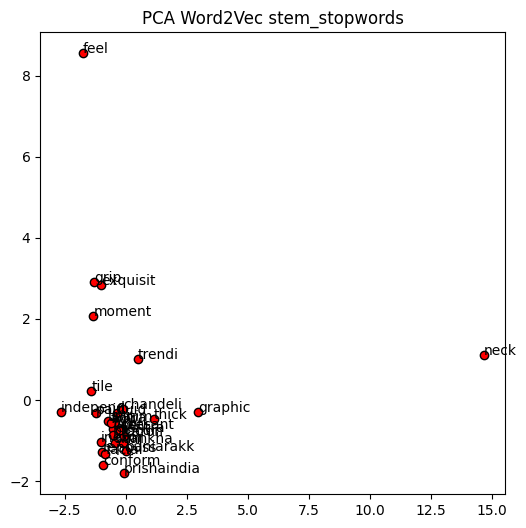

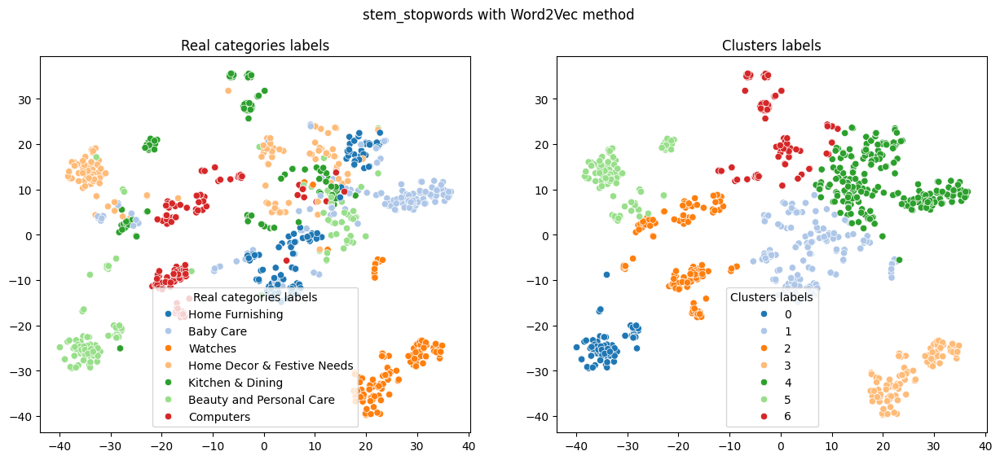

ARI: 0.3748
Train the Word2Vec model
Working on stem_all_common:
Time to train the model: 1.55 seconds
Number of words used in the Word2Vec model with stem_all_common: 4054
Fit Tokenizer
Number of unique words: 4055
Embedding matrix
Word embedding rate: 1.0
Embedding matrix shape: (4055, 300)
Embedding layer


/Users/ikusawalaetitia/Desktop/work/projects/python/P6-txt-img_classification/myenv/lib/python3.10/site-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


Model: "functional_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_21 (InputLayer)     │ (None, 295)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ embedding_10 (Embedding)        │ (None, 295, 300)       │     1,216,500 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling1d_9      │ (None, 300)            │             0 │
│ (GlobalAveragePooling1D)        │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,216,500 (4.64 MB)

 Trainable params: 1,216,500 (4.64 MB)

 Non-trainable params: 0 (0.00 B)

Execute model
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


/Users/ikusawalaetitia/Desktop/work/projects/python/P6-txt-img_classification/myenv/lib/python3.10/site-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_40']
Received: inputs=Tensor(shape=(32, 295))
  warnings.warn(msg)
/Users/ikusawalaetitia/Desktop/work/projects/python/P6-txt-img_classification/myenv/lib/python3.10/site-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_40']
Received: inputs=Tensor(shape=(None, 295))
  warnings.warn(msg)


Embedding shape: (1050, 300)
ARI: 0.5779 | Duration: 1.0 seconds


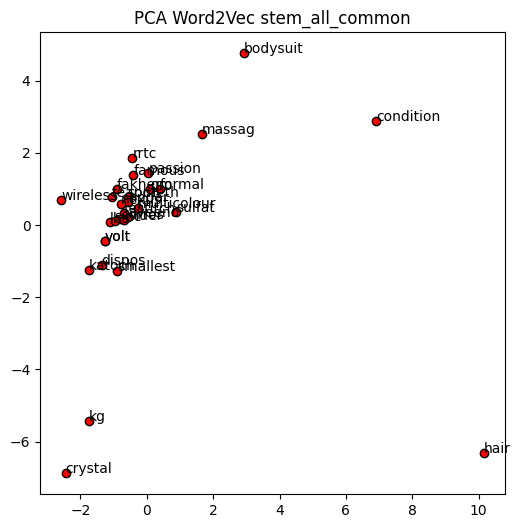

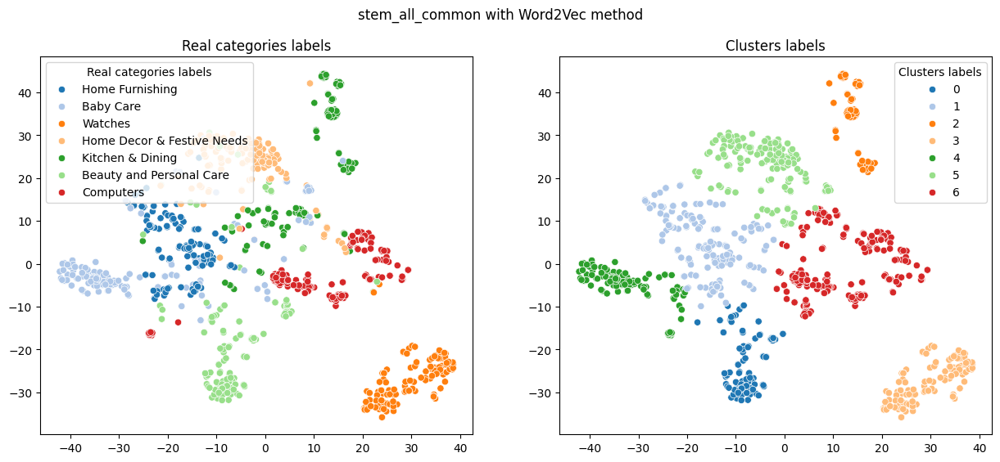

ARI: 0.5779
Train the Word2Vec model
Working on stem_3_cat_common:
Time to train the model: 1.20 seconds
Number of words used in the Word2Vec model with stem_3_cat_common: 3777
Fit Tokenizer
Number of unique words: 3778
Embedding matrix
Word embedding rate: 1.0
Embedding matrix shape: (3778, 300)
Embedding layer


/Users/ikusawalaetitia/Desktop/work/projects/python/P6-txt-img_classification/myenv/lib/python3.10/site-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


Model: "functional_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_23 (InputLayer)     │ (None, 227)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ embedding_11 (Embedding)        │ (None, 227, 300)       │     1,133,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling1d_10     │ (None, 300)            │             0 │
│ (GlobalAveragePooling1D)        │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,133,400 (4.32 MB)

 Trainable params: 1,133,400 (4.32 MB)

 Non-trainable params: 0 (0.00 B)

Execute model
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


/Users/ikusawalaetitia/Desktop/work/projects/python/P6-txt-img_classification/myenv/lib/python3.10/site-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_44']
Received: inputs=Tensor(shape=(32, 227))
  warnings.warn(msg)
/Users/ikusawalaetitia/Desktop/work/projects/python/P6-txt-img_classification/myenv/lib/python3.10/site-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_44']
Received: inputs=Tensor(shape=(None, 227))
  warnings.warn(msg)


Embedding shape: (1050, 300)
ARI: 0.3309 | Duration: 1.0 seconds


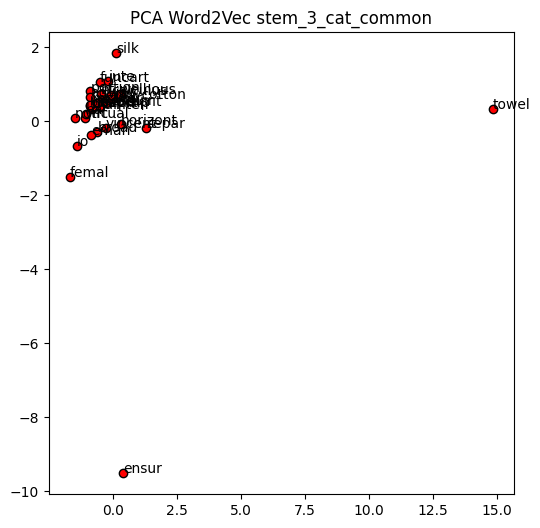

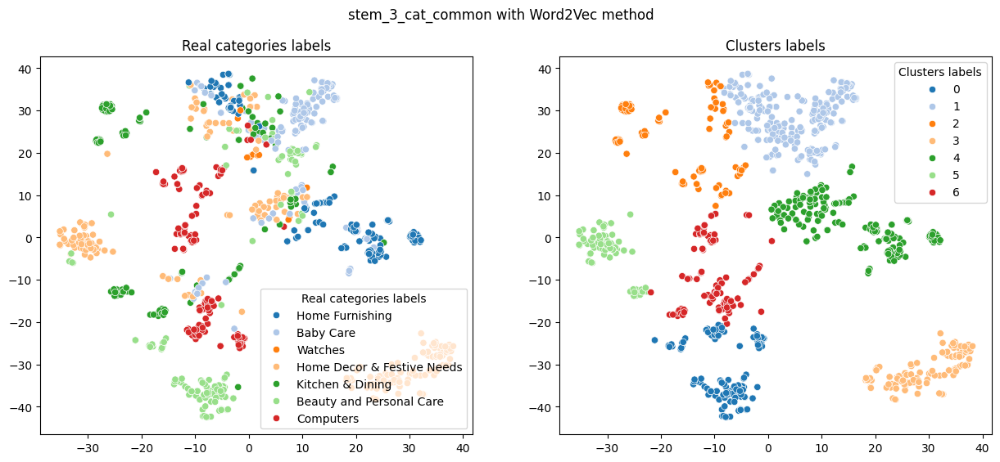

ARI: 0.3309
Train the Word2Vec model
Working on stem_all:
Time to train the model: 1.10 seconds
Number of words used in the Word2Vec model with stem_all: 3735
Fit Tokenizer
Number of unique words: 3736
Embedding matrix
Word embedding rate: 1.0
Embedding matrix shape: (3736, 300)
Embedding layer


/Users/ikusawalaetitia/Desktop/work/projects/python/P6-txt-img_classification/myenv/lib/python3.10/site-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_25 (InputLayer)     │ (None, 165)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ embedding_12 (Embedding)        │ (None, 165, 300)       │     1,120,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling1d_11     │ (None, 300)            │             0 │
│ (GlobalAveragePooling1D)        │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,120,800 (4.28 MB)

 Trainable params: 1,120,800 (4.28 MB)

 Non-trainable params: 0 (0.00 B)

Execute model
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


/Users/ikusawalaetitia/Desktop/work/projects/python/P6-txt-img_classification/myenv/lib/python3.10/site-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_48']
Received: inputs=Tensor(shape=(32, 165))
  warnings.warn(msg)
/Users/ikusawalaetitia/Desktop/work/projects/python/P6-txt-img_classification/myenv/lib/python3.10/site-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_48']
Received: inputs=Tensor(shape=(None, 165))
  warnings.warn(msg)


Embedding shape: (1050, 300)
ARI: 0.4642 | Duration: 1.0 seconds


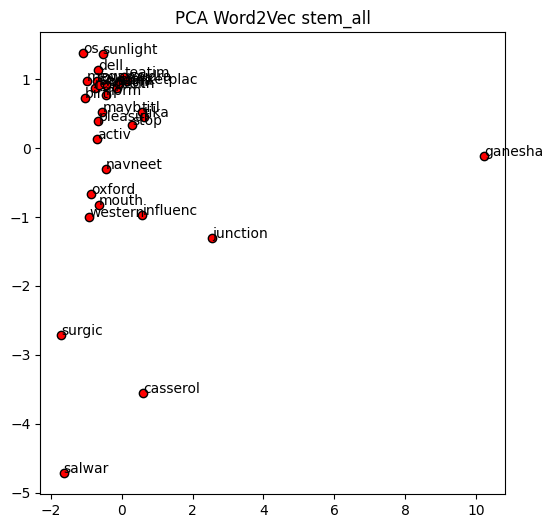

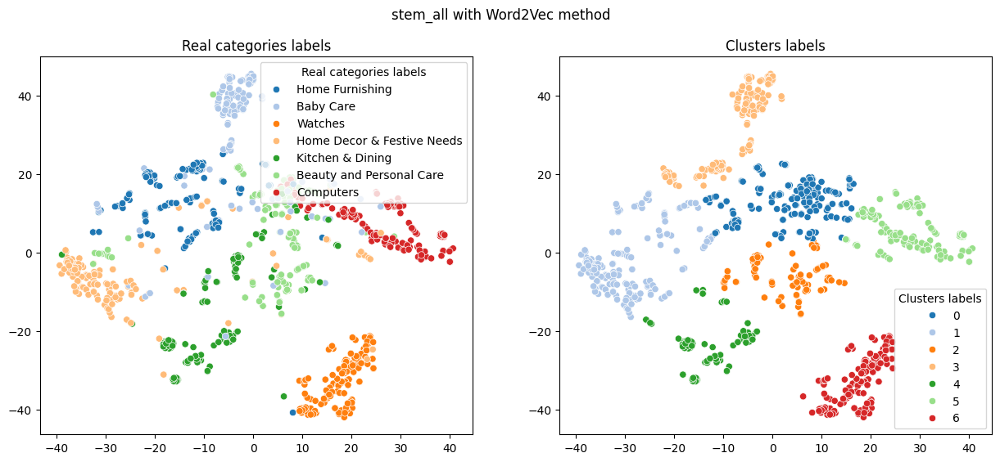

ARI: 0.4642
Train the Word2Vec model
Working on lemma_stopwords:
Time to train the model: 2.14 seconds
Number of words used in the Word2Vec model with lemma_stopwords: 4411
Fit Tokenizer
Number of unique words: 4412
Embedding matrix
Word embedding rate: 1.0
Embedding matrix shape: (4412, 300)
Embedding layer


/Users/ikusawalaetitia/Desktop/work/projects/python/P6-txt-img_classification/myenv/lib/python3.10/site-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


Model: "functional_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_27 (InputLayer)     │ (None, 365)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ embedding_13 (Embedding)        │ (None, 365, 300)       │     1,323,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling1d_12     │ (None, 300)            │             0 │
│ (GlobalAveragePooling1D)        │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,323,600 (5.05 MB)

 Trainable params: 1,323,600 (5.05 MB)

 Non-trainable params: 0 (0.00 B)

Execute model
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


/Users/ikusawalaetitia/Desktop/work/projects/python/P6-txt-img_classification/myenv/lib/python3.10/site-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_52']
Received: inputs=Tensor(shape=(32, 365))
  warnings.warn(msg)
/Users/ikusawalaetitia/Desktop/work/projects/python/P6-txt-img_classification/myenv/lib/python3.10/site-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_52']
Received: inputs=Tensor(shape=(None, 365))
  warnings.warn(msg)


Embedding shape: (1050, 300)
ARI: 0.3306 | Duration: 1.0 seconds


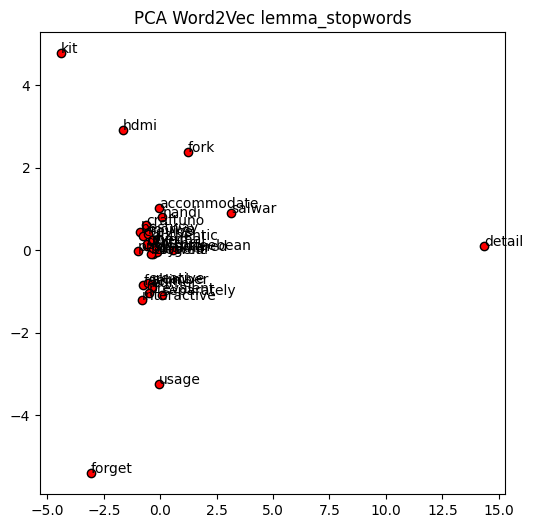

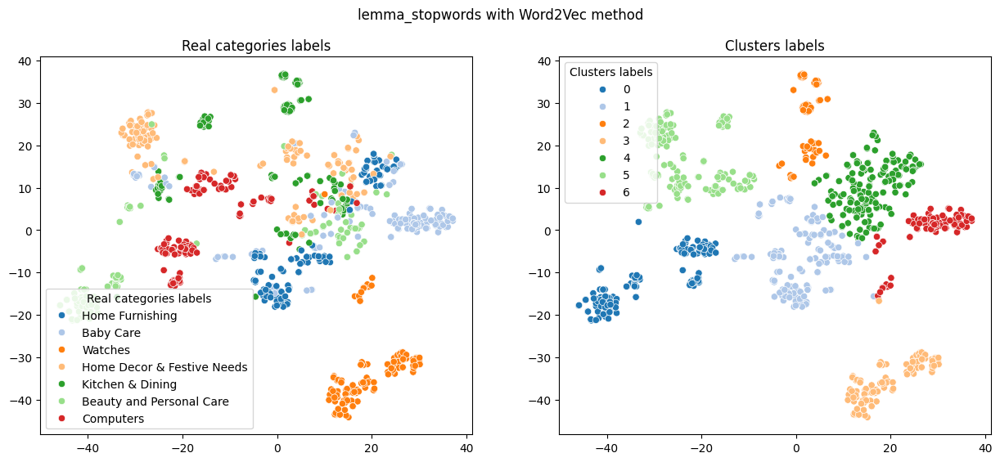

ARI: 0.3306
Train the Word2Vec model
Working on lemma_all_common:
Time to train the model: 1.51 seconds
Number of words used in the Word2Vec model with lemma_all_common: 4379
Fit Tokenizer
Number of unique words: 4380
Embedding matrix
Word embedding rate: 1.0
Embedding matrix shape: (4380, 300)
Embedding layer


/Users/ikusawalaetitia/Desktop/work/projects/python/P6-txt-img_classification/myenv/lib/python3.10/site-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


Model: "functional_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_29 (InputLayer)     │ (None, 295)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ embedding_14 (Embedding)        │ (None, 295, 300)       │     1,314,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling1d_13     │ (None, 300)            │             0 │
│ (GlobalAveragePooling1D)        │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,314,000 (5.01 MB)

 Trainable params: 1,314,000 (5.01 MB)

 Non-trainable params: 0 (0.00 B)

Execute model
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


/Users/ikusawalaetitia/Desktop/work/projects/python/P6-txt-img_classification/myenv/lib/python3.10/site-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_56']
Received: inputs=Tensor(shape=(32, 295))
  warnings.warn(msg)
/Users/ikusawalaetitia/Desktop/work/projects/python/P6-txt-img_classification/myenv/lib/python3.10/site-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_56']
Received: inputs=Tensor(shape=(None, 295))
  warnings.warn(msg)


Embedding shape: (1050, 300)
ARI: 0.6184 | Duration: 1.0 seconds


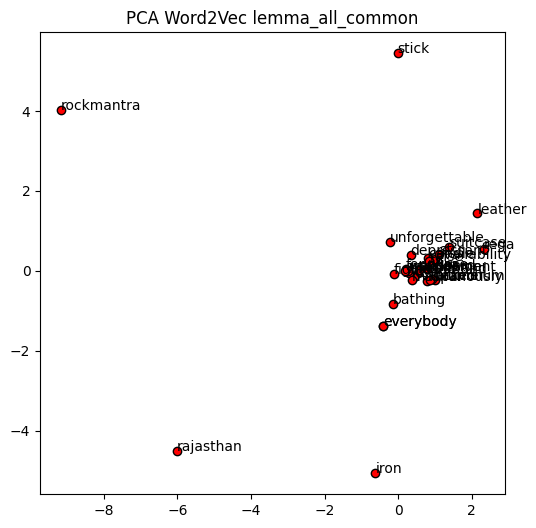

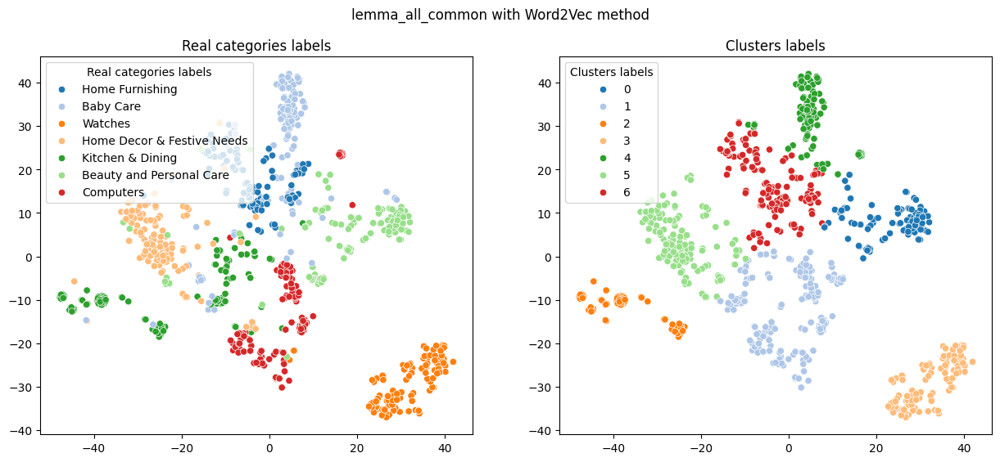

ARI: 0.6184
Train the Word2Vec model
Working on lemma_3_cat_common:
Time to train the model: 1.16 seconds
Number of words used in the Word2Vec model with lemma_3_cat_common: 4024
Fit Tokenizer
Number of unique words: 4025
Embedding matrix
Word embedding rate: 1.0
Embedding matrix shape: (4025, 300)
Embedding layer


/Users/ikusawalaetitia/Desktop/work/projects/python/P6-txt-img_classification/myenv/lib/python3.10/site-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


Model: "functional_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_31 (InputLayer)     │ (None, 226)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ embedding_15 (Embedding)        │ (None, 226, 300)       │     1,207,500 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling1d_14     │ (None, 300)            │             0 │
│ (GlobalAveragePooling1D)        │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,207,500 (4.61 MB)

 Trainable params: 1,207,500 (4.61 MB)

 Non-trainable params: 0 (0.00 B)

Execute model
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


/Users/ikusawalaetitia/Desktop/work/projects/python/P6-txt-img_classification/myenv/lib/python3.10/site-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_60']
Received: inputs=Tensor(shape=(32, 226))
  warnings.warn(msg)
/Users/ikusawalaetitia/Desktop/work/projects/python/P6-txt-img_classification/myenv/lib/python3.10/site-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_60']
Received: inputs=Tensor(shape=(None, 226))
  warnings.warn(msg)


Embedding shape: (1050, 300)
ARI: 0.323 | Duration: 1.0 seconds


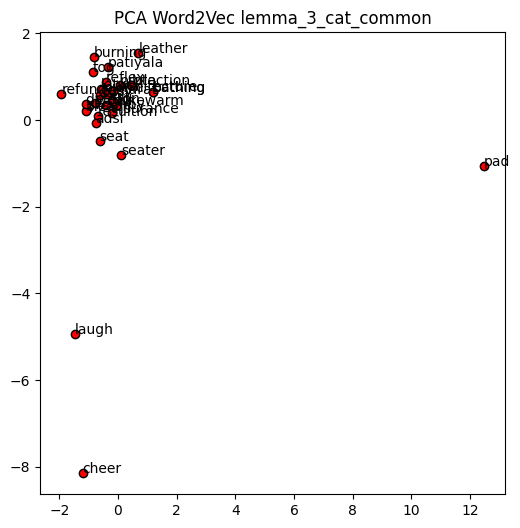

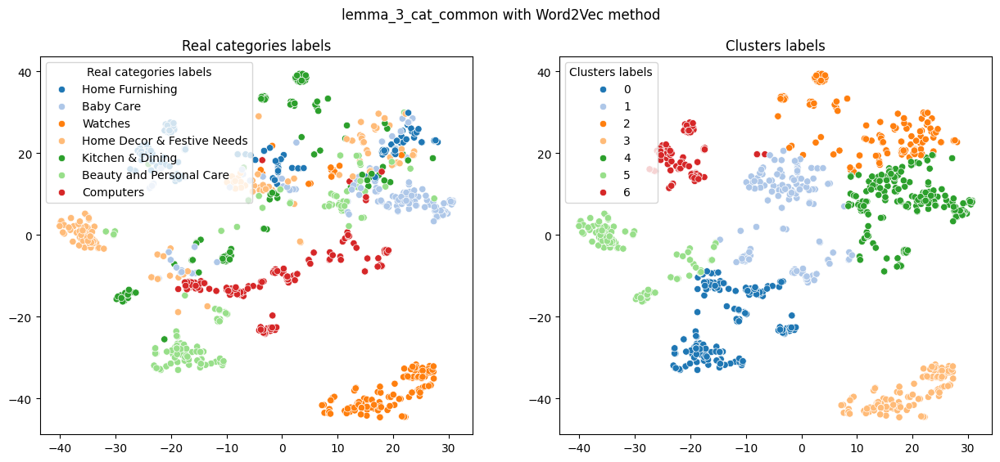

ARI: 0.323
Train the Word2Vec model
Working on lemma_all:
Time to train the model: 1.08 seconds
Number of words used in the Word2Vec model with lemma_all: 3981
Fit Tokenizer
Number of unique words: 3982
Embedding matrix
Word embedding rate: 1.0
Embedding matrix shape: (3982, 300)
Embedding layer


/Users/ikusawalaetitia/Desktop/work/projects/python/P6-txt-img_classification/myenv/lib/python3.10/site-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


Model: "functional_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_33 (InputLayer)     │ (None, 165)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ embedding_16 (Embedding)        │ (None, 165, 300)       │     1,194,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling1d_15     │ (None, 300)            │             0 │
│ (GlobalAveragePooling1D)        │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,194,600 (4.56 MB)

 Trainable params: 1,194,600 (4.56 MB)

 Non-trainable params: 0 (0.00 B)

Execute model
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


/Users/ikusawalaetitia/Desktop/work/projects/python/P6-txt-img_classification/myenv/lib/python3.10/site-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_64']
Received: inputs=Tensor(shape=(32, 165))
  warnings.warn(msg)
/Users/ikusawalaetitia/Desktop/work/projects/python/P6-txt-img_classification/myenv/lib/python3.10/site-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_64']
Received: inputs=Tensor(shape=(None, 165))
  warnings.warn(msg)


Embedding shape: (1050, 300)
ARI: 0.537 | Duration: 1.0 seconds


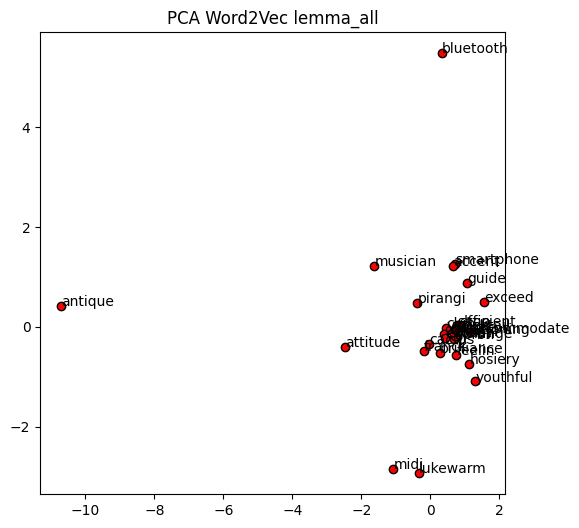

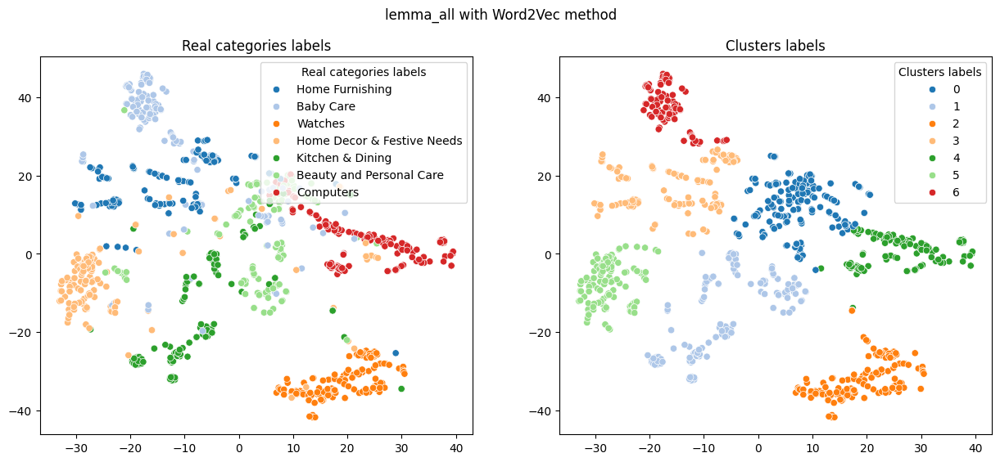

ARI: 0.537


,strategy,method,ARI,X_tsne,kmeans_labels
17,lemma_all_common,Word2Vec,0.6184,"[[-12.777171, 26.013866], [6.536494, 20.947687...","[6, 4, 4, 6, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, ..."
13,stem_all_common,Word2Vec,0.5779,"[[-24.280182, 11.305544], [-21.854849, -5.5867...","[1, 4, 4, 1, 1, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, ..."
19,lemma_all,Word2Vec,0.5370,"[[-16.521414, 21.046494], [-14.444295, 12.6718...","[3, 3, 3, 3, 3, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, ..."
5,stem_all_common,TF/IDF,0.5243,"[[-26.825813, -4.220964], [-12.260504, 22.2140...","[4, 3, 3, 4, 4, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, ..."
9,lemma_all_common,TF/IDF,0.5184,"[[-26.94138, -6.7239995], [-13.119645, 20.4956...","[3, 6, 6, 3, 3, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, ..."
15,stem_all,Word2Vec,0.4642,"[[-18.956966, 11.34686], [-12.52382, 3.6353405...","[1, 1, 1, 1, 1, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, ..."
4,stem_stopwords,TF/IDF,0.4347,"[[7.2356305, 23.031767], [12.858523, 0.9764162...","[6, 6, 6, 6, 6, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, ..."
2,lemma_stopwords,Count,0.4310,"[[-5.3394547, -33.656017], [-2.4283843, -3.373...","[1, 3, 3, 1, 1, 4, 4, 3, 4, 4, 4, 4, 4, 4, 4, ..."
10,lemma_3_cat_common,TF/IDF,0.4275,"[[23.025282, 1.7743618], [1.09479, -28.062222]...","[1, 4, 4, 4, 4, 3, 3, 3, 0, 3, 3, 3, 3, 3, 3, ..."
8,lemma_stopwords,TF/IDF,0.4232,"[[9.73308, 22.693542], [8.812195, 0.6982813], ...","[5, 5, 5, 5, 5, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, ..."


In [197]:
for col in columns_to_count:
    # Tokenize the sentences
    sentences = df_prep[col].to_list()
    sentences = [simple_preprocess(text) for text in sentences]
    max_length = max([len(sentence) for sentence in sentences])

    t = time.time()
    print('Train the Word2Vec model')
    print('=======================')
    w2v_model = Word2Vec(
        vector_size=w2v_size,
        window=w2v_window,
        min_count=w2v_min_count,
        epochs=w2v_epochs,
        workers=w2v_workers,
        seed=42
        )

    # Build the vocabulary table
    w2v_model.build_vocab(sentences)

    # Train the Word2Vec model
    w2v_model.train(sentences, total_examples=w2v_model.corpus_count, epochs=w2v_epochs)
    model_vector = w2v_model.wv
    w2v_words = model_vector.index_to_key

    print(f'Working on {col}:')
    print(f'Time to train the model: {time.time() - t:.2f} seconds')
    print(f'Number of words used in the Word2Vec model with {col}: {len(w2v_words)}')
    # Select a sample of words to display
    sample_words = np.random.choice(w2v_words, 30)
    display_pca_scatterplot(model_vector, sample_words, title=f'PCA Word2Vec {col}')

    # Tokenization
    print('Fit Tokenizer')
    print('==============')
    # vectorize a text corpus by turning each text into either a sequence of integers or into a vector where the coefficient for each token could be binary, based on word count, based on tf-idf, etc.
    tokenizer = Tokenizer()
    # update the internal vocabulary based on the list of texts
    tokenizer.fit_on_texts(sentences)
    #  convert the text descriptions into sequences of integers using the tokenizer and then pad these sequences to ensure they all have the same length.
    x_sentences = pad_sequences(tokenizer.texts_to_sequences(sentences), maxlen=max_length, padding='post')

    # number of unique words in the tokenizer's vocabulary
    num_words = len(tokenizer.word_index) + 1
    print(f'Number of unique words: {num_words}')

    print('Embedding matrix')
    print('================')
    # Create an embedding matrix
    word_index = tokenizer.word_index
    vocab_size = len(word_index) + 1
    # create a matrix of zeros with the same shape as the vocabulary
    embedding_matrix = np.zeros((vocab_size, w2v_size))
    i=0
    j=0

    for word, idx in word_index.items():
        i +=1
        if word in w2v_words:
            j += 1
            embedding_vector = model_vector[word]
            if embedding_vector is not None:
                embedding_matrix[idx] = model_vector[word]

    word_rate = np.round(j/i, 4)
    print(f'Word embedding rate: {word_rate}')
    print(f'Embedding matrix shape: {embedding_matrix.shape}')

    print('Embedding layer')
    print('===============')
    # Create an embedding layer
    input = Input(shape=(len(x_sentences),max_length), dtype='float64')
    word_input = Input(shape=(max_length,), dtype='float64')
    # Embedding layer
    word_embedding = Embedding(
        input_dim=vocab_size,
        output_dim=w2v_size,
        weights=[embedding_matrix],
        input_length=max_length)(word_input)

    word_vec = GlobalAveragePooling1D()(word_embedding)
    embed_model = Model([word_input], word_vec)

    embed_model.summary()

    print('Execute model')
    print('==============')
    # Execute the model
    x_embed = embed_model.predict(x_sentences)
    print(f'Embedding shape: {x_embed.shape}')

    ARI_sc, X_tsne, labels = ARI_score(x_embed, y_cat_num)
    new_row = pd.DataFrame([{'strategy': col, 'method': 'Word2Vec', 'ARI': ARI_sc, 'X_tsne': X_tsne, 'kmeans_labels': labels}])
    results = pd.concat([results,new_row], ignore_index=True)

    plot_clusters(X_tsne, df_prep['main_category'], labels, ARI_sc, title=f"{col} with Word2Vec method")

display(results.sort_values(by='ARI', ascending=False))

#### Embedding matrix

In [174]:
print('***Create embedding matrix***')
w2v_size = 300
# retrieves the word index dictionary from the tokenizer
word_index = tokenizer.word_index
vocab_size = len(word_index) + 1

# initialize the embedding matrix with zeros. The matrix has a shape of (vocab_size, w2v_size), where each row corresponds to a word in the vocabulary and each column corresponds to a dimension in the word vector.
embedding_matrix = np.zeros((vocab_size, w2v_size))
i=0
j=0

# iterate over each word in the word index and each word in the Word2Vec model:
for word, idx in word_index.items():
    i += 1
    for word in w2v_words_stem:
        j += 1
        # retrieve the embedding vector for the current word from the Word2Vec model
        embedding_vector = model_vectors_stem[word]
        if embedding_vector is not None:
            # assign the embedding vector to the corresponding row in the embedding matrix.
            embedding_matrix[idx] = model_vectors_stem[word]

word_rate = np.round(j/i, 4)
print(f'Word embedding rate: {word_rate}')
print(f'Embedding matrix shape: {embedding_matrix.shape}')

***Create embedding matrix***
Word embedding rate: 3735.0
Embedding matrix shape: (4049, 300)


In [ ]:
# Model
input = tf.keras.layers.Input(shape=(max_len_stem,))